# Celltype Markers

Done on WT cells only to get proper markers

In [119]:
here::i_am("rna_atac/clustering/02_clustering.ipynb")

source(here::here("settings.R"))
source(here::here("utils.R"))

suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(Seurat))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(ArchR))

BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 21

# Multi core using future - built in to seurat
plan("multicore", workers = 16)
options(future.globals.maxSize = 50 * 1024 ^ 3) # for 50 Gb RAM

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code



In [120]:
args = list()

# Metadata
args$metadata = file.path(io$basedir, 'results/rna_atac/clustering/metadata_celltype_annotated_v2.txt.gz')

# RNA_sce
args$rna_sce = file.path(io$basedir, 'processed/rna/SingleCellExperiment.rds')

# Archr
args$archr_directory = file.path(io$basedir, 'processed/atac/archR')

# outdir
args$outdir = file.path(io$basedir, 'results/rna_atac/celltype_markers/')
dir.create(args$outdir, recursive=TRUE, showWarnings =FALSE)

In [121]:
# Load meta
meta = fread(args$metadata) %>% 
    .[genotype=='WT']  # Only WT cells for celltype marker search

## RNA

In [4]:
# load sce
rna.sce <- load_SingleCellExperiment(args$rna_sce, normalise = TRUE, cells = meta$cell)
colData(rna.sce) = meta %>% as.data.frame() %>% tibble::column_to_rownames('cell') %>% DataFrame()

#### Seurat

In [7]:
# Convert to Seurat
seurat = as.Seurat(rna.sce)

# Prepare mofa umap
umap.mtx = meta[,c('cell', 'UMAP1', 'UMAP2')] %>% 
    as.data.frame(.) %>% 
    tibble::column_to_rownames('cell') %>%
    as.matrix()
seurat[["umap"]] <- CreateDimReducObject(embeddings = umap.mtx, key = "umap_", assay = DefaultAssay(seurat))

Idents(seurat) = seurat@meta.data$celltype_v2

In [7]:
# Marker detection
markers <- FindAllMarkers(seurat, 
                          only.pos = TRUE, 
                          min.pct = 0.1,
                          logfc.threshold = 0.5, 
                          verbose = F)

In [8]:
library(dplyr)
markers_top = markers %>%
    group_by(cluster) %>%
    slice_max(n = 15, order_by = avg_log2FC)

fwrite(markers_top, sprintf('%s/markers_RNA_top.txt.gz', args$outdir))
fwrite(markers, sprintf('%s/markers_RNA.txt.gz', args$outdir))

In [8]:
markers = fread(sprintf('%s/markers_RNA.txt.gz', args$outdir))

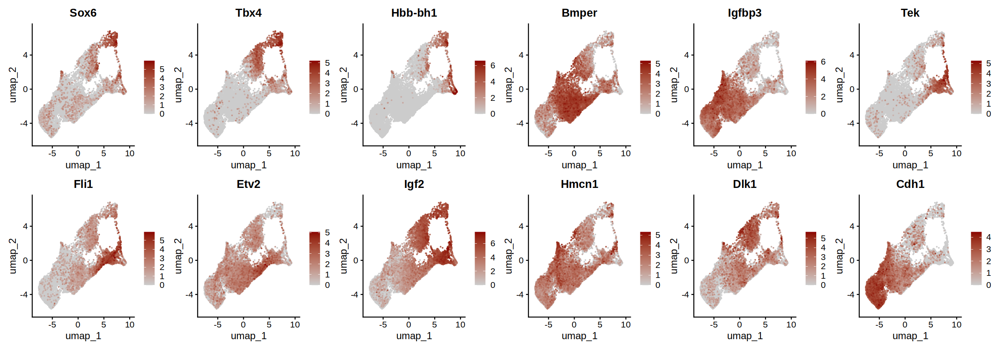

In [10]:
features = markers %>%
    group_by(cluster) %>%
    slice_max(n = 1, order_by = avg_log2FC) %>% .$gene

options(repr.plot.width=20, repr.plot.height=7)
FeaturePlot(seurat, 
            features = features, 
            cols = c('grey80', 'darkred'),
            ncol = 6,
            order = T)

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


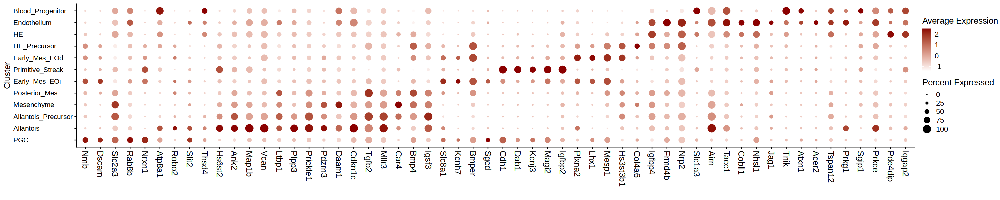

In [11]:
features = as.data.table(markers) %>%
    .[, cluster := factor(cluster, levels = names(opts$celltype_v2.colors))] %>% 
    .[order(cluster, -p_val_adj)] %>% 
    .[, head(.SD, 5), by = cluster] %>% 
    .$gene

seurat@meta.data$celltype_v1 = factor(seurat@meta.data$celltype_v1, levels = opts$celltype_levels)
seurat@meta.data$celltype_v2 = factor(seurat@meta.data$celltype_v2, levels = names(opts$celltype_v2.colors))

options(repr.plot.width=25, repr.plot.height=5)
DotPlot(seurat, features = unique(features), group.by = 'celltype_v2') + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    RotatedAxis() +
    ylab('Cluster') + xlab('') +
    theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


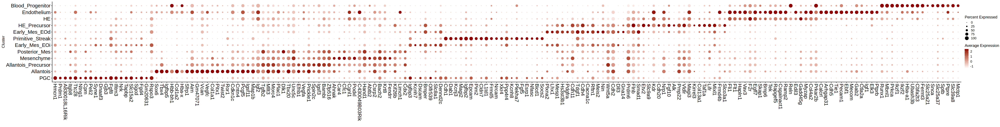

In [12]:
features = as.data.table(markers) %>%
    .[, cluster := factor(cluster, levels = names(opts$celltype_v2.colors))] %>% 
    .[order(cluster, -avg_log2FC)] %>% 
    .[, head(.SD, 20), by = cluster] %>% 
    .$gene

options(repr.plot.width=55, repr.plot.height=7)
DotPlot(seurat, features = unique(features), group.by = 'celltype_v2') + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    RotatedAxis() +
    ylab('Cluster') + xlab('') +
    theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=20, color='black'), 
                         axis.text.y=element_text(hjust=1, size = 20, color='black'))

In [13]:
head(as.data.table(markers)[cluster == 'Early_Mes_EOi'][order(p_val_adj)], 50)

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
2.340250e-304,0.5755880,0.949,0.721,7.555497e-300,Early_Mes_EOi,Rspo3
3.748733e-271,0.5504612,0.516,0.180,1.210278e-266,Early_Mes_EOi,Olfr539
6.111236e-261,0.6640078,0.824,0.508,1.973013e-256,Early_Mes_EOi,Igfbp3
6.964838e-228,0.5978838,0.738,0.439,2.248598e-223,Early_Mes_EOi,Hmcn1
3.664876e-217,0.6425648,0.602,0.299,1.183205e-212,Early_Mes_EOi,Syne1
7.565570e-214,0.5046044,0.866,0.592,2.442544e-209,Early_Mes_EOi,Dennd2c
1.169583e-204,0.5902771,0.540,0.239,3.775997e-200,Early_Mes_EOi,Dscam
1.623072e-199,0.6076718,0.432,0.161,5.240088e-195,Early_Mes_EOi,Sgcd
2.352021e-198,0.5548464,0.861,0.544,7.593499e-194,Early_Mes_EOi,Bmper


Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


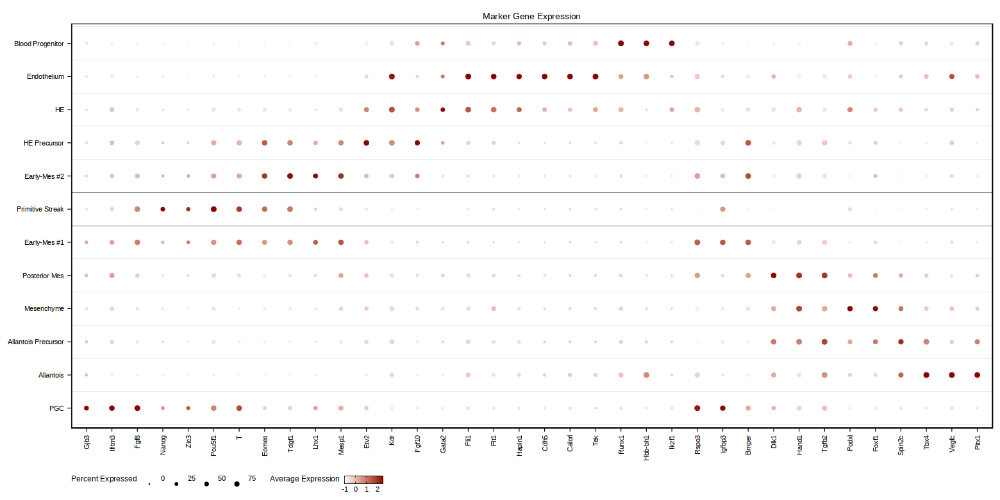

In [305]:
features = c('Gjb3', 'Ifitm3', 'Fgf8',  # PGC
             'Nanog', 'Zic3', 'Pou5f1', 'T', #PS
             'Eomes', 'Tdgf1', 'Lhx1', 'Mesp1', #Early Mes 1
             'Etv2', 'Kdr', 'Fgf10', # HE Pre
             'Gata2', 'Fli1', 'Flt1', 'Hapln1', # HE
             'Cdh5', 'Calcrl', 'Tek', # Endo
             'Runx1', 'Hbb-bh1', 'Ikzf1', # Blood P
             'Rspo3', 'Igfbp3', 'Bmper', # Early Mes 2 --> search for other markers?
             'Dlk1', 'Hand1', 'Tgfb2',# Post Mes
             'Podxl', 'Foxf1', # Mesenchyme
             'Spin2c',
             'Tbx4', 'Vegfc', 'Pitx1' # Allantois
             )

# meta = meta[,celltype_v2 := factor(celltype_v2, levels = rev(names(opts$celltype_v2.colors)))]
seurat$celltype_v2_figure = opts$celltype_v2_figure[match(seurat$celltype_v2, names(opts$celltype_v2_figure))]

p1 = DotPlot(seurat, features = unique(features), group.by = 'celltype_v2_figure', scale = TRUE) + 
    scale_color_gradient(low='white', high='darkred', name = 'Average Expression') + 
    scale_size(range = c(-0.3, 1.5)) + 
    scale_y_discrete(limits = names(opts$celltype_v2.colors2)) +
    scale_x_discrete(limits = features) +
    guides(colour = guide_colourbar(
         barwidth = 2.5, barheight = 0.5,
        frame.colour = "black", 
        ticks.colour = "black"
    )) + 
    geom_hline(yintercept=seq(.5, 20, 1), alpha=0.2, linewidth = 0.1) + 
    geom_hline(yintercept=c(6.5, 7.5), alpha=1, linewidth = 0.1) + 
    RotatedAxis() +
    ggtitle('Marker Gene Expression') + 
    theme(text=element_text(size=6), 
                         axis.text.x=element_text(angle=90,hjust=1,vjust=0.5, size=6), 
                         axis.text.y=element_text(hjust=1, size = 6),
                         axis.title = element_blank(),
                         panel.border = element_rect(color='black', linewidth=0.5),
                         plot.title = element_text(size=8, hjust=0.5, vjust=-1.5, face='plain'),
                         axis.line = element_blank(),
                         axis.ticks=element_line(linewidth=0.25),
                         legend.title = element_text(size = 7, hjust=0, vjust = 1),
                         legend.text = element_text(size = 6, hjust=0.5, vjust = 1),
                         legend.position = 'bottom')

options(repr.plot.width=13, repr.plot.height=6.5)
p1

In [306]:
ggsave(file.path(io$basedir, 'figures/WT_celltype_marker_genes.pdf'), 
       plot = p1 + theme(legend.position = 'none'),
       width = 95, 
       height = 45, 
       units = "mm")

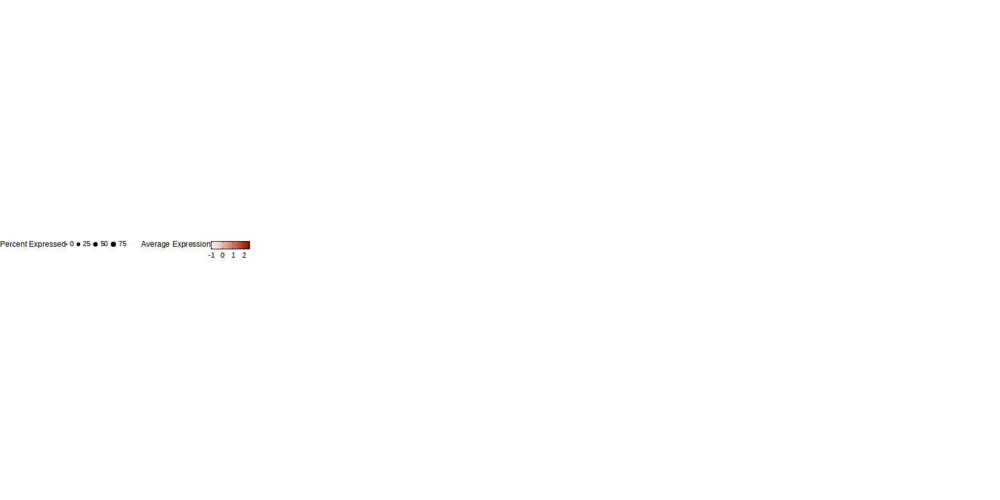

In [178]:
celltype_legend = as_ggplot(get_legend(p1 + theme(legend.key.size  = unit(0, "pt"),
                                                legend.margin=margin(0,0,0,0))))

celltype_legend
ggsave(file.path(io$basedir, 'figures/WT_celltype_marker_genes_legend.pdf'), 
       plot = celltype_legend,
       width = 90, 
       height = 8, 
       units = "mm")

#### EdgeR

In [15]:
suppressPackageStartupMessages(library(edgeR))

In [16]:
all_genes = rownames(rna.sce)
non_informative = all_genes[grep("*Rik|^Gm|^Rps|^Rpl|^Olfr", all_genes)] # Mt genes kept for this analysis
rna.sce = rna.sce[!rownames(rna.sce) %in% non_informative,]
rna.sce

class: SingleCellExperiment 
dim: 19979 19740 
metadata(0):
assays(2): counts logcounts
rownames(19979): Xkr4 Rp1 ... AC234645.1 AC149090.1
rowData names(0):
colnames(19740): 1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1
  1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1 ...
  rv_eo_deg_day4_control#TTTGTGGCATCCCTCA-1
  rv_eo_deg_day4_control#TTTGTGTTCCTGAATA-1
colData names(27): barcode sample ... celltype_v1 celltype_v2
reducedDimNames(0):
mainExpName: RNA
altExpNames(0):

In [190]:
# Marker gene identification using edgeR (https://www.bioconductor.org/packages/devel/bioc/vignettes/edgeR/inst/doc/edgeRUsersGuide.pdf)
library(BiocParallel)
BPPARAM = MulticoreParam(22)
atlas.pb = aggregateAcrossCells(rna.sce, id = colData(rna.sce)[,c("replicate", "celltype_v2")], BPPARAM = BPPARAM)

# discard samples with too few cells
discarded <- atlas.pb$ncells < 15
atlas.pb <- atlas.pb[,!discarded]
atlas.pb$sample = factor(atlas.pb$sample)

# Convert to edgeR object
atlas.edgeR = scran::convertTo(atlas.pb, type="edgeR")

keep.genes = filterByExpr(atlas.edgeR, group=atlas.edgeR$samples$celltype_v2, min.count=10, min.total.count=4000)
atlas.edgeR <- atlas.edgeR[keep.genes, , keep=FALSE]
table(keep.genes)
atlas.edgeR = calcNormFactors(atlas.edgeR)
design = model.matrix(~ factor(atlas.edgeR$samples$celltype_v2) + factor(atlas.edgeR$samples$replicate))

# Estimate dispersion
atlas.edgeR <- estimateDisp(atlas.edgeR, design, robust=TRUE)

fit <- glmQLFit(atlas.edgeR, design, robust=TRUE)
#saveRDS(fit, file.path(args$outdir, 'Atlas_edgeR_fit.rds'))
#fit = readRDS(file.path(args$outdir, 'Atlas_edgeR_fit.rds'))

cluster = factor(atlas.edgeR$samples$celltype_v2)
ncls = nlevels(cluster)
contr = rbind( matrix(1/(1-ncls), ncls, ncls),
matrix(0, ncol(design)-ncls, ncls) )
diag(contr) = 1
contr[1,] = 0
rownames(contr) = colnames(design)
colnames(contr) = paste0("cluster", levels(cluster))

# Get markers for every cell-type
markers = mclapply(1:ncls, function(i){
    a = Sys.time()
    tmp = glmQLFTest(fit, contrast=contr[,i])
    tmp = as.data.table(topTags(tmp, n=1e10)$table, keep.rownames=T) %>% 
        setnames('rn', 'gene') %>% 
        .[,celltype := levels(cluster)[i]]
    b = Sys.time()
    print(paste0('Cluster ', i, ' done, duration: ', b-a))
    return(tmp)
}, mc.cores=24) %>% rbindlist()

keep.genes
FALSE  TRUE 
12163  7816 

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


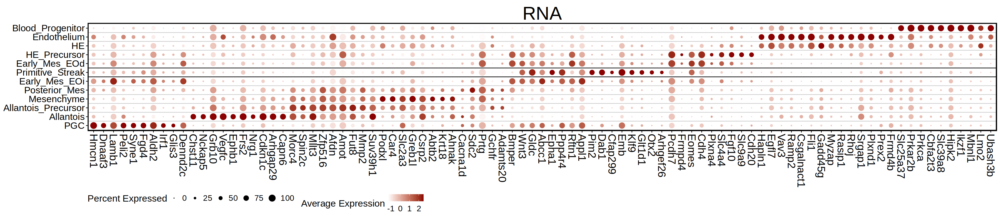

In [194]:
features = markers %>%
    .[, celltype := factor(celltype, levels = names(opts$celltype_v2.colors))] %>% 
    .[order(celltype, FDR)] %>% .[FDR < 1e-5 & logFC > 0] %>% 
    .[, head(.SD, 10), by = celltype] %>%
    .$gene %>% unique()

options(repr.plot.width=30, repr.plot.height=6.5)
DotPlot(seurat, features = unique(features), group.by = 'celltype_v2') + 
    scale_color_gradient(low='white', high='darkred', name='Expression\n(scaled)') + 
    scale_y_discrete(limits = names(opts$celltype_v2.colors)) +
    scale_x_discrete(limits = features) +
    geom_hline(yintercept=seq(.5, 20, 1), alpha=0.2) + 
    geom_hline(yintercept=c(6.5, 7.5), alpha=1) + 
    RotatedAxis() +
    ggtitle('RNA') + 
    theme(text=element_text(size=20), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=23), 
                         axis.text.y=element_text(hjust=1, size = 20),
                         axis.title = element_blank(),
                         panel.border = element_rect(color='black', linewidth=1.5),
                         plot.title = element_text(size=40, hjust=0.5, vjust=0, face='plain'),
                         axis.line = element_blank(),
                         legend.position = 'bottom')

In [195]:
fwrite(DEGs, sprintf('%s/markers_RNA_edgeR.txt.gz', args$outdir))

## ATAC

In [122]:
args$archr_directory = file.path(io$basedir, 'processed/atac/archR')
ArchRProject <- loadArchRProject(args$archr_directory)[meta$cell]
ArchRProject = ArchRProject[meta$cell]

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

In [123]:
addArchRThreads(22)

Setting default number of Parallel threads to 22.



In [124]:
ArchRProject <- addCellColData(ArchRProj = ArchRProject, 
                                    data = meta$celltype_v1,
                                    cells = meta$cell,
                                    name = "celltype_v1",
                                    force=TRUE)
ArchRProject <- addCellColData(ArchRProj = ArchRProject, 
                                    data = meta$celltype_v2,
                                    cells = meta$cell,
                                    name = "celltype_v2",
                                    force=TRUE)

##### JASPAR

In [258]:
# Differential ChromVAR one v all
diffMotif <- getMarkerFeatures(
    ArchRProj = ArchRProject, 
    testMethod = "wilcoxon",
    binarize = FALSE,
    #useMatrix = "silicoChIP_JASPARMatrix",
    useMatrix = "silicoChIP_JASPAR_v2",
    groupBy = "celltype_v2",
    useSeqnames="z",
    verbose = T
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-20688d75d7a51d-Date-2024-04-26_Time-14-47-23.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Assays.Matrix

2024-04-26 14:47:23 : Matching Known Biases, 0.002 mins elapsed.

###########
2024-04-26 14:47:29 : Completed Pairwise Tests, 0.087 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-20688d75d7a51d-Date-2024-04-26_Time-14-47-23.log



In [261]:
saveRDS(diffMotif, sprintf('%s/diff_chromVAR_silicoChIP_JASPAR.rds', args$outdir))

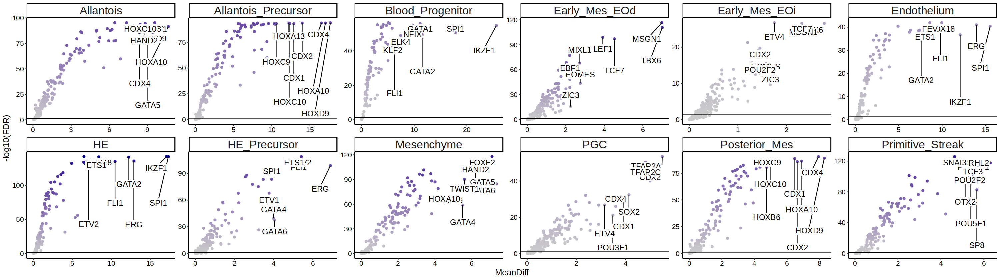

In [262]:
diffMotif.dt = lapply(colnames(diffMotif), function(x){
    tmp = data.table(motif = str_split(rowData(diffMotif)$name, '_') %>% map_chr(1),
                                  FDR = assay(diffMotif[,x], 'FDR')[[1]],
                                  MeanDiff = assay(diffMotif[,x], 'MeanDiff')[[1]]) %>% 
                        .[order(-MeanDiff)] %>% 
                        .[,celltype_v2 := x]
    return(tmp)
}) %>% rbindlist() %>% .[MeanDiff != Inf]

p = ggplot(diffMotif.dt[MeanDiff>0], aes(MeanDiff, -log10(FDR), label=motif)) +
            geom_point(aes(col = -log10(FDR))) +
            scale_color_gradient(low='gray80', high='darkblue', name = '-log10(FDR)') + 
            ggrepel::geom_text_repel(data=diffMotif.dt[MeanDiff>0] %>% 
                                            .[,head(.SD, 8), by=celltype_v2],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 1,
                                 bg.color='white', 
                                 bg.r = 0.3,
                            direction = "y",
                             color='black',
                                 size=5) +
    geom_hline(yintercept = -log10(0.05))+
    facet_wrap(~celltype_v2, scales='free', ncol=6) + 
    theme_classic() +
    theme(
       axis.text = element_text(color='black'),
      # axis.title = element_text(size=rel(1.0), color='black'),
        strip.text = element_text(size=20),
      text=element_text(size=15),
      legend.position="none"
    ) 
options(repr.plot.width=25, repr.plot.height=7)
p

In [263]:
silicoJASPAR.mtx = getMatrixFromProject(ArchRProject, 'silicoChIP_JASPAR_v2')

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-20688d27392945-Date-2024-04-26_Time-14-48-58.log
If there is an issue, please report to github with logFile!

2024-04-26 14:49:01 : Organizing colData, 0.048 mins elapsed.

2024-04-26 14:49:01 : Organizing rowData, 0.054 mins elapsed.

2024-04-26 14:49:01 : Organizing rowRanges, 0.055 mins elapsed.

2024-04-26 14:49:01 : Organizing Assays (1 of 2), 0.055 mins elapsed.

2024-04-26 14:49:01 : Organizing Assays (2 of 2), 0.06 mins elapsed.

2024-04-26 14:49:02 : Constructing SummarizedExperiment, 0.065 mins elapsed.

2024-04-26 14:49:03 : Finished Matrix Creation, 0.086 mins elapsed.



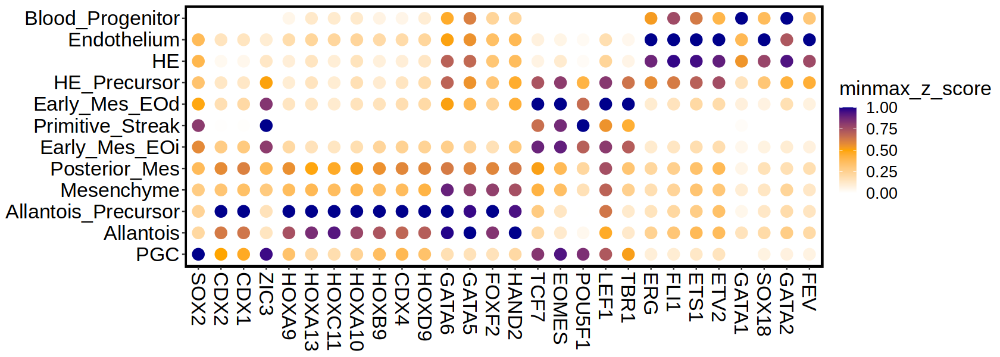

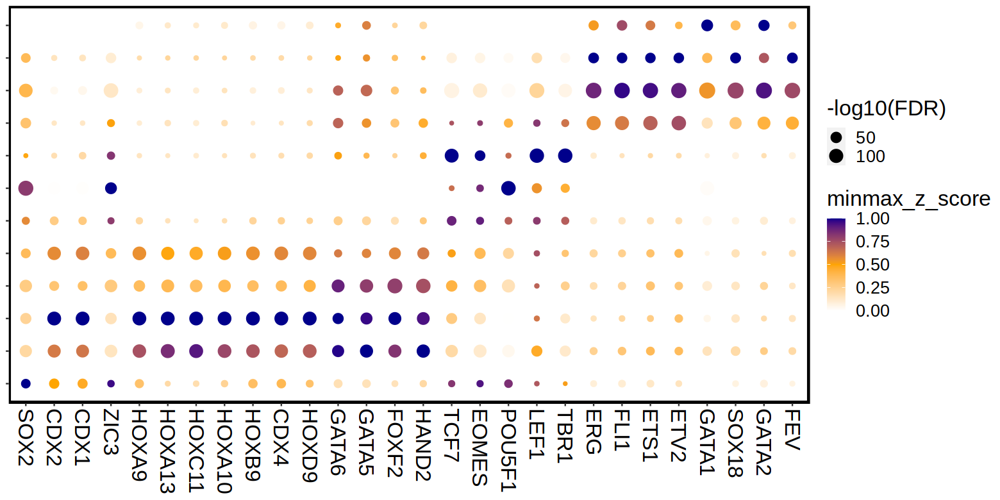

In [ ]:
features = diffMotif.dt[MeanDiff>0] %>% 
                .[, celltype_v2 := factor(celltype_v2, levels = names(opts$celltype_v2.colors))] %>% 
                .[order(celltype_v2, -MeanDiff)] %>% 
                .[,head(.SD, 5), by=celltype_v2] %>% .$motif %>% unique()

features = features[features %in% rownames(silicoJASPAR.mtx)]

tmp = silicoJASPAR.mtx[features,]
celltype_chromVAR.dt = lapply(unique(meta$celltype_v2), function(x){
    tmp2 = data.table(celltype_v2 = x,
                      feature = rownames(tmp),
                      z_score = rowMeans(tmp@assays@data$z[,meta[celltype_v2 == x, cell]])
                      )
    return(tmp2)
}) %>% rbindlist() %>% 
    .[,minmax_z_score := minmax.normalisation(z_score), by='feature'] %>% 
    setnames('feature', 'motif')

options(repr.plot.width=14, repr.plot.height=5)
ggplot(celltype_chromVAR.dt, aes(motif, celltype_v2, color=minmax_z_score)) + 
    geom_point(size = 5) +
    scale_color_gradientn(colors = c('white', 'orange', 'darkblue')) +
   # scale_color_gradientn(colors = rainbow(n=2)) +
    scale_y_discrete(limits = names(opts$celltype_v2.colors)) +
    scale_x_discrete(limits = features) +
  #  theme_bw() + 
    theme(text=element_text(size=20), 
                         axis.text = element_text(color='black'),
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=20), 
                         axis.text.y=element_text(hjust=1, size = 20),
                         axis.title = element_blank(),
                         panel.border = element_rect(color='black', linewidth=1.5, fill=NA),
                         panel.background = element_blank(),
                         axis.line = element_blank())

tmp = merge(diffMotif.dt, celltype_chromVAR.dt , by=c('celltype_v2', 'motif'))

options(repr.plot.width=8, repr.plot.height=6.5)
ggplot(tmp, aes(motif, celltype_v2, color=minmax_z_score, size = -log10(FDR))) + 
    geom_point() +
    scale_color_gradientn(colors = c('white', 'orange', 'darkblue')) +
   # scale_color_gradientn(colors = rainbow(n=2)) +
    scale_y_discrete(limits = names(opts$celltype_v2.colors)) +
    scale_x_discrete(limits = features) +
  #  theme_bw() + 
    theme(text=element_text(size=20), 
                         axis.text = element_text(color='black'),
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=20), 
                         axis.text.y=element_text(hjust=1, size = 20),
                         axis.title = element_blank(),
                         panel.border = element_rect(color='black', linewidth=1.5, fill=NA),
                         panel.background = element_blank(),
                         axis.line = element_blank())

##### CISBP

In [415]:
# Differential ChromVAR one v all
diffMotif <- getMarkerFeatures(
    ArchRProj = ArchRProject, 
    testMethod = "wilcoxon",
    binarize = FALSE,
   # useMatrix = "silicoChIP_CISBPMatrix",
    useMatrix = "silicoChIP_CISBP_v2", # "silicoChIP_CISBPMatrix", # this is the v2 in silico ChIP for CISBP
   # maxCells = 1e10, # Use all cells
    groupBy = "celltype_v2",
    useSeqnames="z",
    verbose = F
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-20688d9e895cc-Date-2024-04-26_Time-18-41-18.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Assays.Matrix

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-20688d9e895cc-Date-2024-04-26_Time-18-41-18.log



In [416]:
colnames(diffMotif)

[1] "Allantois"           "Allantois_Precursor" "Blood_Progenitor"   
 [4] "Early_Mes_EOd"       "Early_Mes_EOi"       "Endothelium"        
 [7] "HE"                  "HE_Precursor"        "Mesenchyme"         
[10] "PGC"                 "Posterior_Mes"       "Primitive_Streak"

In [283]:
saveRDS(diffMotif, sprintf('%s/diff_chromVAR_silicoChIP_CISBP.rds', args$outdir))

In [125]:
diffMotif = readRDS(sprintf('%s/diff_chromVAR_silicoChIP_CISBP.rds', args$outdir))

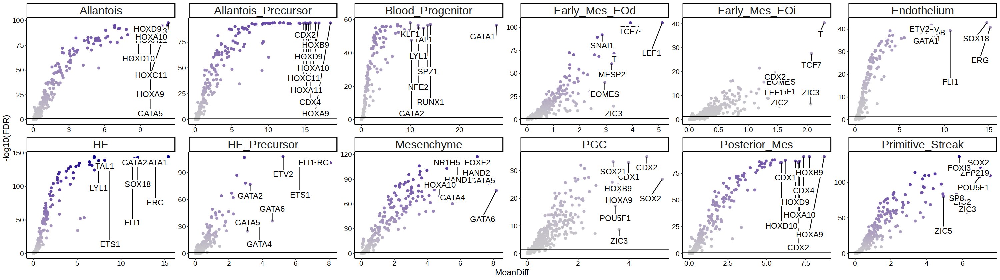

In [128]:
diffMotif.dt = lapply(colnames(diffMotif), function(x){
    tmp = data.table(motif = str_split(rowData(diffMotif)$name, '_') %>% map_chr(1),
                                  FDR = assay(diffMotif[,x], 'FDR')[[1]],
                                  MeanDiff = assay(diffMotif[,x], 'MeanDiff')[[1]]) %>% 
                        .[order(-MeanDiff)] %>% 
                        .[,celltype_v2 := x]
    return(tmp)
}) %>% rbindlist() %>% .[MeanDiff != Inf]

p = ggplot(diffMotif.dt[MeanDiff>0], aes(MeanDiff, -log10(FDR), label=motif)) +
            geom_point(aes(col = -log10(FDR))) +
            scale_color_gradient(low='gray80', high='darkblue', name = '-log10(FDR)') + 
            ggrepel::geom_text_repel(data=diffMotif.dt[MeanDiff>0] %>% 
                                            .[,head(.SD, 8), by=celltype_v2],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 1,
                                 bg.color='white', 
                                 bg.r = 0.3,
                            direction = "y",
                             color='black',
                                 size=5) +
    geom_hline(yintercept = -log10(0.05))+
    facet_wrap(~celltype_v2, scales='free', ncol=6) + 
    theme_classic() +
    theme(
       axis.text = element_text(color='black'),
      # axis.title = element_text(size=rel(1.0), color='black'),
        strip.text = element_text(size=20),
      text=element_text(size=15),
      legend.position="none"
    ) 
options(repr.plot.width=25, repr.plot.height=7)
p

In [126]:
silicoCISBP.mtx = getMatrixFromProject(ArchRProject, 'silicoChIP_CISBP_v2')

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-369f1357c9d-Date-2024-06-19_Time-16-45-20.log
If there is an issue, please report to github with logFile!

2024-06-19 16:45:39 : Organizing colData, 0.327 mins elapsed.

2024-06-19 16:45:40 : Organizing rowData, 0.336 mins elapsed.

2024-06-19 16:45:40 : Organizing rowRanges, 0.336 mins elapsed.

2024-06-19 16:45:40 : Organizing Assays (1 of 2), 0.337 mins elapsed.

2024-06-19 16:45:40 : Organizing Assays (2 of 2), 0.347 mins elapsed.

2024-06-19 16:45:41 : Constructing SummarizedExperiment, 0.357 mins elapsed.

2024-06-19 16:45:42 : Finished Matrix Creation, 0.38 mins elapsed.



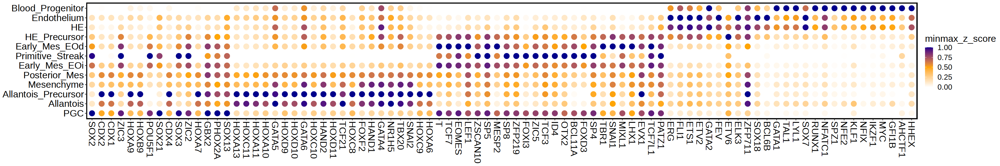

In [129]:
features = diffMotif.dt[MeanDiff>0] %>% 
                .[, celltype_v2 := factor(celltype_v2, levels = names(opts$celltype_v2.colors))] %>% 
                .[order(celltype_v2, -MeanDiff)] %>% 
                .[,head(.SD, 15), by=celltype_v2] %>% .$motif %>% unique()

features = features[features %in% rownames(silicoCISBP.mtx)]

tmp = silicoCISBP.mtx[features,]
celltype_chromVAR.dt = lapply(unique(meta$celltype_v2), function(x){
    tmp2 = data.table(celltype_v2 = x,
                      feature = rownames(tmp),
                      z_score = rowMeans(tmp@assays@data$z[,meta[celltype_v2 == x, cell]])
                      )
    return(tmp2)
}) %>% rbindlist() %>% 
    .[,minmax_z_score := minmax.normalisation(z_score), by='feature'] %>% 
    setnames('feature', 'motif')

options(repr.plot.width=30, repr.plot.height=5)
ggplot(celltype_chromVAR.dt, aes(motif, celltype_v2, color=minmax_z_score)) + 
    geom_point(size = 5) +
    scale_color_gradientn(colors = c('white', 'orange', 'darkblue')) +
   # scale_color_gradientn(colors = rainbow(n=2)) +
    scale_y_discrete(limits = names(opts$celltype_v2.colors)) +
    scale_x_discrete(limits = features) +
  #  theme_bw() + 
    theme(text=element_text(size=20), 
                         axis.text = element_text(color='black'),
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=20), 
                         axis.text.y=element_text(hjust=1, size = 20),
                         axis.title = element_blank(),
                         panel.border = element_rect(color='black', linewidth=1.5, fill=NA),
                         panel.background = element_blank(),
                         axis.line = element_blank())

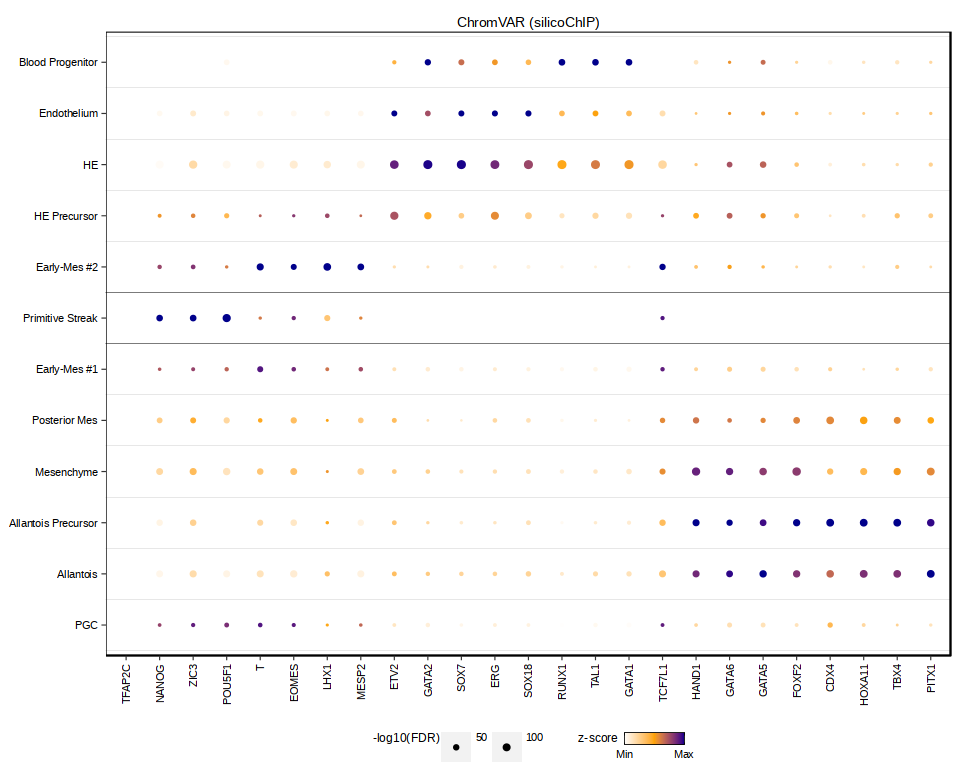

In [309]:
features = c('TFAP2C', # Add TFAP2C once updated chromvar is done!
             'NANOG', 'ZIC3','POU5F1',
             'T', 'EOMES', 
             'LHX1', 'MESP2', 
             'ETV2', 'GATA2', 
             'SOX7', 'ERG', 'SOX18', 
             'RUNX1', 'TAL1', 'GATA1', 
             'TCF7L1', 
             'HAND1', 'GATA6', 'GATA5', 'FOXF2',
             'CDX4', 'HOXA11', 'TBX4',  'PITX1'
             )

tmp = silicoCISBP.mtx[features,]
celltype_chromVAR.dt = lapply(unique(meta$celltype_v2), function(x){
    tmp2 = data.table(celltype_v2 = x,
                      feature = rownames(tmp),
                      z_score = rowMeans(tmp@assays@data$z[,meta[celltype_v2 == x, cell]])
                      )
    return(tmp2)
}) %>% rbindlist() %>% 
    .[,minmax_z_score := minmax.normalisation(z_score), by='feature'] %>% 
    setnames('feature', 'motif')


tmp = merge(diffMotif.dt, celltype_chromVAR.dt , by=c('celltype_v2', 'motif'))
tmp$celltype_v2_figure = opts$celltype_v2_figure[match(tmp$celltype_v2, names(opts$celltype_v2_figure))]

options(repr.plot.width=8, repr.plot.height=6.5)
p2 = ggplot(tmp, aes(motif, celltype_v2_figure, color=minmax_z_score, size = -log10(FDR))) + 
    geom_point() +
    scale_color_gradientn(colors = c('white', 'orange', 'darkblue'), name = 'z-score', breaks = c(0,1), labels = c('Min', 'Max')) +
    guides(colour = guide_colourbar(
         barwidth = 2.5, barheight = 0.5,
        frame.colour = "black", 
        ticks.colour = "black"
    )) + 
    scale_size(range = c(-0.3, 1.5)) + 
    scale_y_discrete(limits = names(opts$celltype_v2.colors2)) +
    scale_x_discrete(limits = features) +
    geom_hline(yintercept=seq(.5, 20, 1), alpha=0.2, linewidth = 0.1) + 
    geom_hline(yintercept=c(6.5, 7.5), alpha=1, linewidth = 0.1) + 
    ggtitle('ChromVAR (silicoChIP)') +

    theme(text=element_text(size=6), 
                         axis.text.x=element_text(angle=90,hjust=1,vjust=0.5, size=6, color = 'black'), 
                         axis.text.y=element_text(hjust=1, size = 6, color = 'black'),
                         axis.title = element_blank(),
                         panel.border = element_rect(color='black', linewidth=0.5, fill = NA),
                         panel.background = element_blank(),
                         plot.title = element_text(size=8, hjust=0.5, vjust=-1.5, face='plain'),
                         axis.line = element_blank(),
                         axis.ticks=element_line(linewidth=0.25),
                         legend.title = element_text(size = 7, hjust=0, vjust = 1),
                         legend.text = element_text(size = 6, hjust=0.5, vjust = 1),
                         legend.position = 'bottom',
                        # plot.margin = margin(t = 0, r = 0, b = 0, l = 0) # Adjust margins as needed
)

p2

In [310]:
ggsave(file.path(io$basedir, 'figures/WT_celltype_chromvar.pdf'), 
       plot = p2 + theme(legend.position = 'none'),
       width = 80, 
       height = 40, 
       units = "mm")

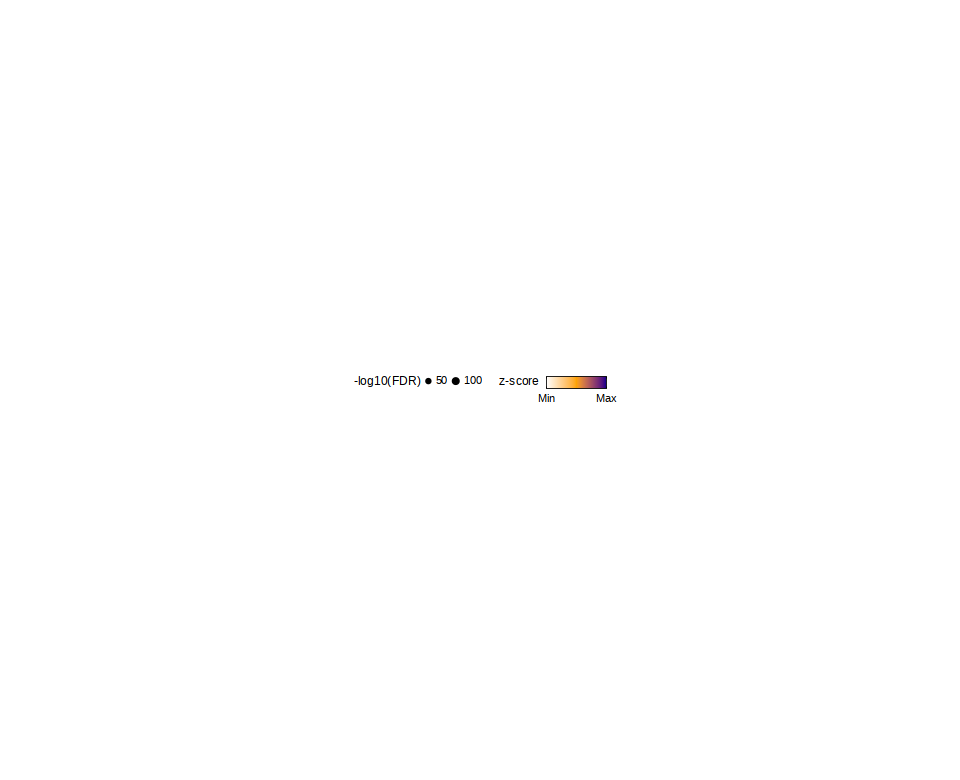

In [185]:
celltype_legend = as_ggplot(get_legend(p2 + theme(legend.key.size  = unit(0, "pt"),
                                                legend.margin=margin(0,0,0,0),
                                                 legend.key = element_blank())))

celltype_legend
ggsave(file.path(io$basedir, 'figures/WT_celltype_chromvar_legend.pdf'), 
       plot = celltype_legend,
       width = 90, 
       height = 8, 
       units = "mm")

### Motif Enrichment

In [224]:
plot_enr_heatmap = function(enrichMotifs, ntop=25, TFs = NULL) {
    heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = ntop, returnMatrix = TRUE)
    rownames(heatmapEM) = str_split(rownames(heatmapEM), ' ') %>% map_chr(1)
    
    enriched.dt = melt(as.data.table(heatmapEM, keep.rownames=T) %>% setnames('rn', 'TF'), id.vars = c("TF")) %>%
        .[order(-value)] %>% .[,TF:=strsplit(TF, '_') %>% map_chr(1)]

    if(!is.null(TFs)){
        keep_tfs = TFs
    }else{
        keep_tfs = enriched.dt %>% .[,variable:=factor(variable, levels= names(opts$celltype_v2.colors))] %>% .[order(variable)] %>% .[, head(.SD, ntop),  by=variable] %>% .$TF   
    }
    
    enriched.dt = enriched.dt[TF %in% keep_tfs] %>% .[order( -value)] %>% 
        #.[,TF:=strsplit(TF, '_') %>% map_chr(1)] %>%
         .[,TF:=factor(TF, levels=unique(keep_tfs))] %>%
        .[,variable:=factor(variable, levels=names(opts$celltype_v2.colors))]

    p = ggplot(enriched.dt, aes(TF, variable, fill=value)) + 
        geom_tile() +
        scale_fill_gradient(low='white', high='darkblue', name='-log10(P-adj)', breaks = c(0,100), labels = c('Min', 'Max')) +
        geom_hline(yintercept=seq(.5, 20, 1), alpha=0.2) + 
        geom_hline(yintercept=c(6.5, 7.5), alpha=1) + 
        ggtitle('Motifs in marker peaks') + 
        theme(text=element_text(size=20), 
             axis.text = element_text(color='black'),
             axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=23), 
             axis.text.y=element_blank(), #text(hjust=1, size = 20),
             axis.title = element_blank(),
             panel.border = element_rect(color='black', linewidth=1.5, fill = NA),
             panel.background = element_blank(),
             plot.title = element_text(size=40, hjust=0.5, vjust=0, face='plain'),
             axis.line = element_blank(),
             legend.title = element_text(hjust=0, vjust = 1),
             legend.text = element_text(hjust=0.5, vjust = 0.5),
             legend.position = 'bottom')
    
p
    return(p)
}

In [200]:
markersPeaks <- getMarkerFeatures(
    ArchRProj = ArchRProject, 
    useMatrix = "PeakMatrix", 
    groupBy = "celltype_v2",
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon"
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-369f16eb67465-Date-2024-06-19_Time-17-19-00.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2024-06-19 17:19:03 : Matching Known Biases, 0.018 mins elapsed.

###########
2024-06-19 17:20:12 : Completed Pairwise Tests, 1.158 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-369f16eb67465-Date-2024-06-19_Time-17-19-00.log



In [404]:
# CISBP
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_cisbp",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  ))

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-20688d5521b153-Date-2024-04-26_Time-18-10-07.log
If there is an issue, please report to github with logFile!



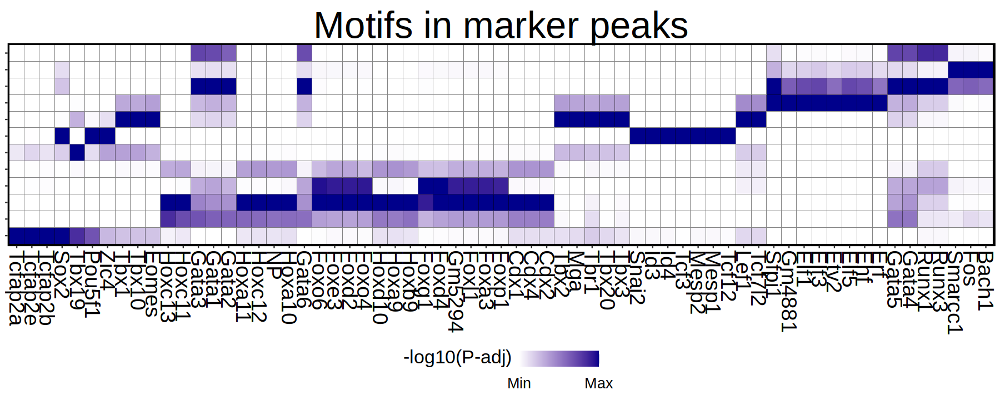

In [405]:
options(repr.plot.width=15, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 10)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-20688d3529a77b-Date-2024-04-26_Time-15-34-40.log
If there is an issue, please report to github with logFile!



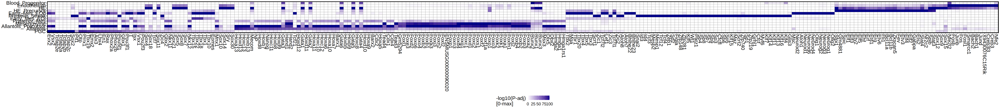

In [366]:
options(repr.plot.width=55, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 50)

In [407]:
rownames(enrichMotifs) = str_split(rownames(enrichMotifs), '_') %>% map_chr(1)

In [410]:
enrichMotifs = enrichMotifs[!duplicated(rownames(enrichMotifs)),]

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-20688d45424cbd-Date-2024-04-26_Time-18-11-10.log
If there is an issue, please report to github with logFile!



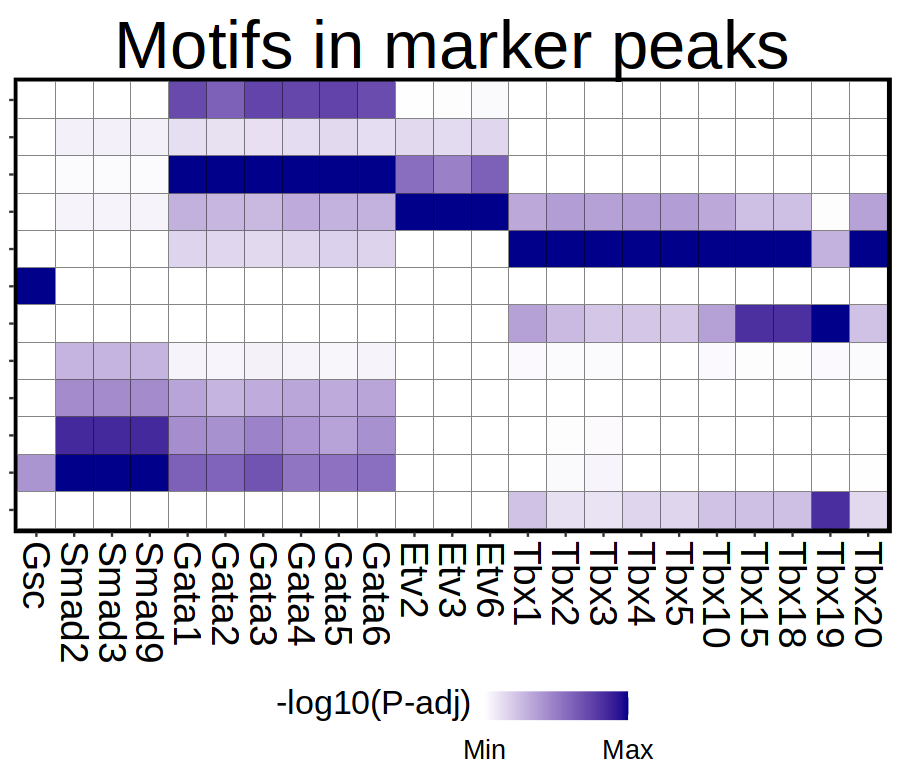

In [411]:
TFs_plot = c('Gsc', paste0('Smad', 1:9), paste0('Gata', 1:10), paste0('Etv', 1:10), paste0('Tbx', 1:20))
TFs_plot = intersect(TFs_plot, rownames(enrichMotifs))

options(repr.plot.width=7.5, repr.plot.height=6.5)
plot_enr_heatmap(enrichMotifs, TFs = TFs_plot, ntop=10000)


ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-20688d1290b92a-Date-2024-04-26_Time-18-08-15.log
If there is an issue, please report to github with logFile!

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-20688d4ef164dd-Date-2024-04-26_Time-18-08-15.log
If there is an issue, please report to github with logFile!



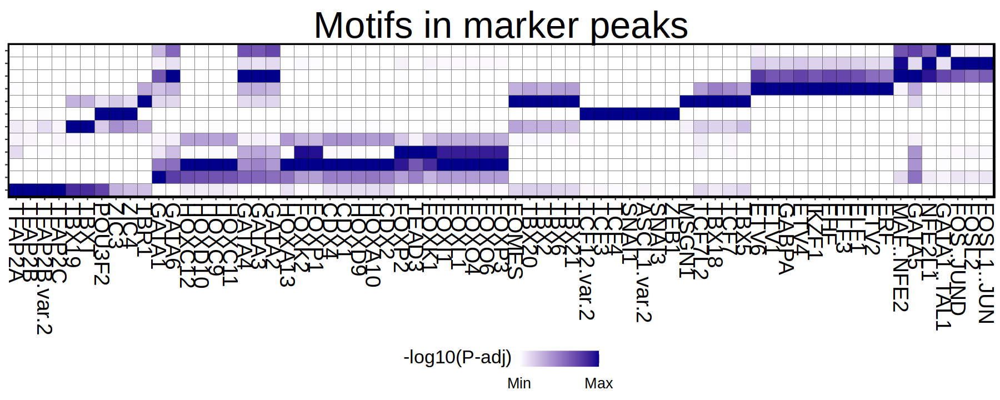

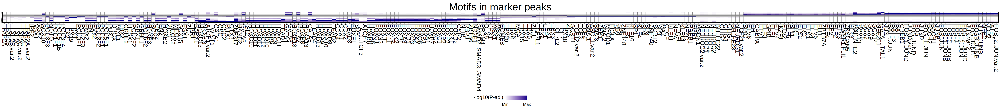

In [399]:
# JASPAR
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_JASPAR2020",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  ))

options(repr.plot.width=15, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 10)

options(repr.plot.width=55, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 50)

In [402]:
rownames(enrichMotifs) = str_split(rownames(enrichMotifs), '_') %>% map_chr(1)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-20688d6dd90ccf-Date-2024-04-26_Time-18-08-51.log
If there is an issue, please report to github with logFile!



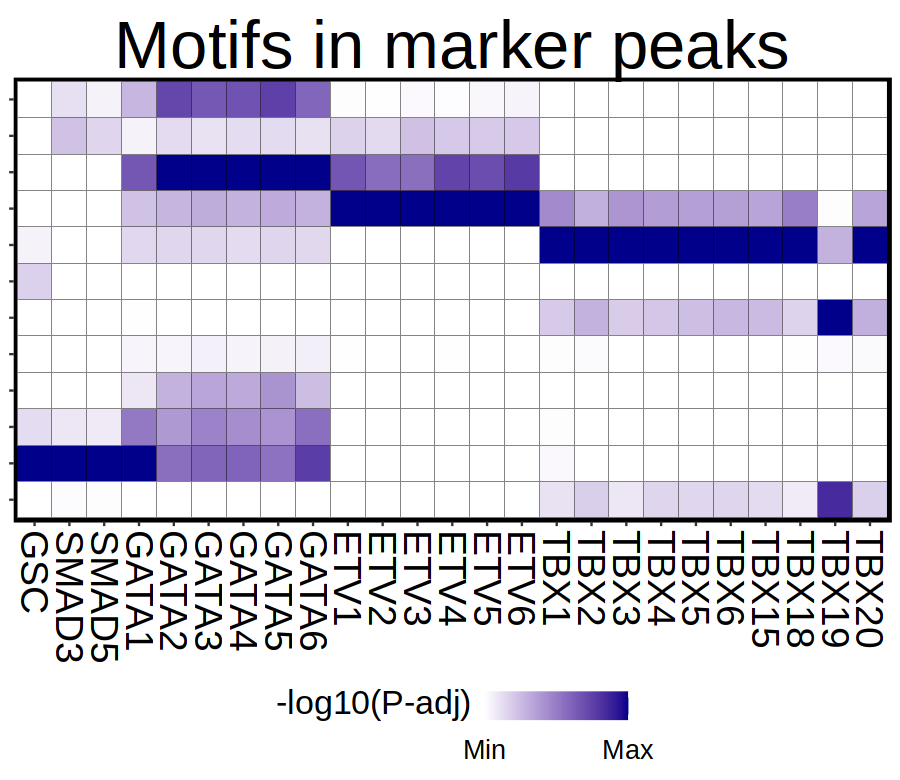

In [403]:
TFs_plot = c('GSC', paste0('SMAD', 1:9), paste0('GATA', 1:10), paste0('ETV', 1:10), paste0('TBX', 1:20))
TFs_plot = intersect(TFs_plot, rownames(enrichMotifs))

options(repr.plot.width=7.5, repr.plot.height=6.5)
plot_enr_heatmap(enrichMotifs, TFs = TFs_plot, ntop=10000)


### silico ChIP motif enrichment

In [368]:
io$multiome = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/multiome_atlas/'
jaspar_silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_jaspar2020.rds'))
assay(jaspar_silico_chip, 'matches') = assay(jaspar_silico_chip, 'VirtualChipScores') > 0.20
assay(jaspar_silico_chip, 'motifScores') = NULL
assay(jaspar_silico_chip, 'motifMatches') = NULL
assay(jaspar_silico_chip, 'motifCounts') = NULL
assay(jaspar_silico_chip, 'VirtualChipScores') = NULL
# Keep only motifs with more than 40 peaks 
tmp = colSums(assay(jaspar_silico_chip, 'matches') )
keep = names(tmp[tmp > 40])
jaspar_silico_chip = jaspar_silico_chip[,keep]

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-20688d62a17c30-Date-2024-04-26_Time-15-35-07.log
If there is an issue, please report to github with logFile!

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-20688d3b7c2180-Date-2024-04-26_Time-15-35-07.log
If there is an issue, please report to github with logFile!



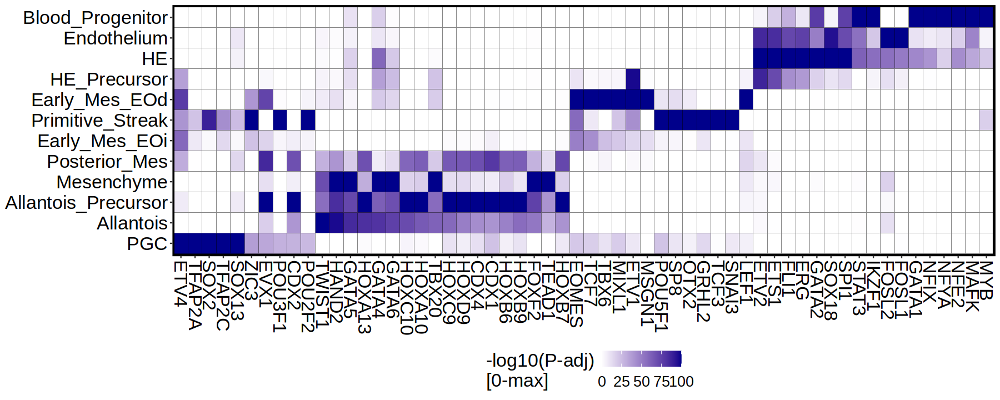

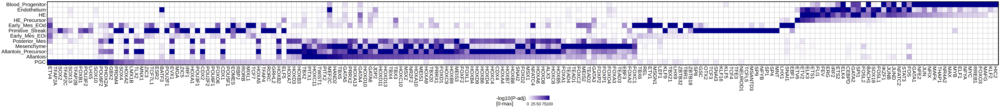

In [369]:
# silicoChip v2 JASPAR
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = ArchRProject,
    #peakAnnotation = "silicoChIP_CISBP",
    matches = jaspar_silico_chip,
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  ))

options(repr.plot.width=15, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 10)

options(repr.plot.width=55, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 50)

In [201]:
io$multiome = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/multiome_atlas/'
cisbp_silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_cisbp.rds'))
assay(cisbp_silico_chip, 'matches') = assay(cisbp_silico_chip, 'VirtualChipScores') > 0.20
assay(cisbp_silico_chip, 'motifScores') = NULL
assay(cisbp_silico_chip, 'motifMatches') = NULL
assay(cisbp_silico_chip, 'motifCounts') = NULL
assay(cisbp_silico_chip, 'VirtualChipScores') = NULL
# Keep only motifs with more than 40 peaks 
tmp = colSums(assay(cisbp_silico_chip, 'matches') )
keep = names(tmp[tmp > 40])
cisbp_silico_chip = cisbp_silico_chip[,keep]

In [202]:
cisbp_silico_chip[,'T']

class: RangedSummarizedExperiment 
dim: 234908 1 
metadata(0):
assays(1): matches
rownames(234908): chr1:3003470-3004070 chr1:3035598-3036198 ...
  chrX:169925416-169926016 chrX:169937236-169937836
rowData names(13): score replicateScoreQuantile ... idx N
colnames(1): T
colData names(1): name

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-369f1617b5588-Date-2024-06-19_Time-17-20-54.log
If there is an issue, please report to github with logFile!

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-369f12612b9c4-Date-2024-06-19_Time-17-20-55.log
If there is an issue, please report to github with logFile!



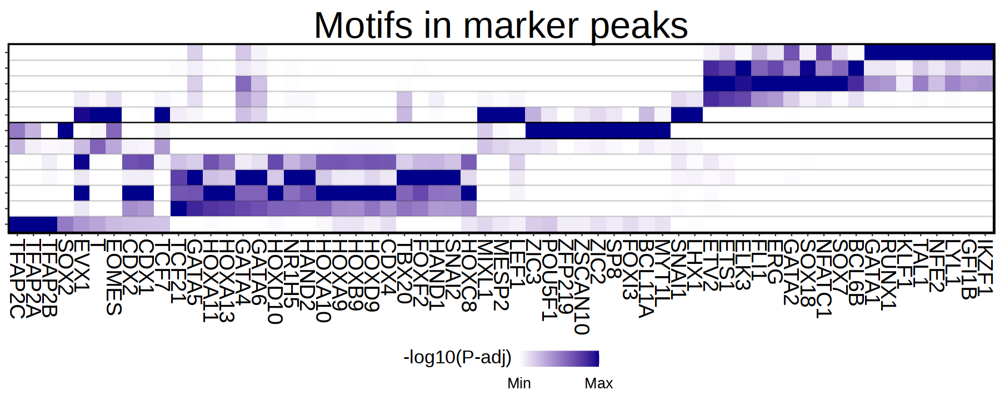

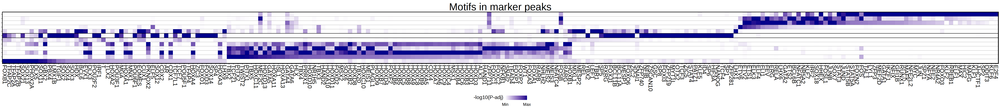

In [203]:
# silicoChip v2 JASPAR
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = ArchRProject,
    #peakAnnotation = "silicoChIP_CISBP",
    matches = cisbp_silico_chip,
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  ))

options(repr.plot.width=15, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 10)

options(repr.plot.width=55, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 50)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-369f13102f0f4-Date-2024-06-19_Time-17-21-13.log
If there is an issue, please report to github with logFile!



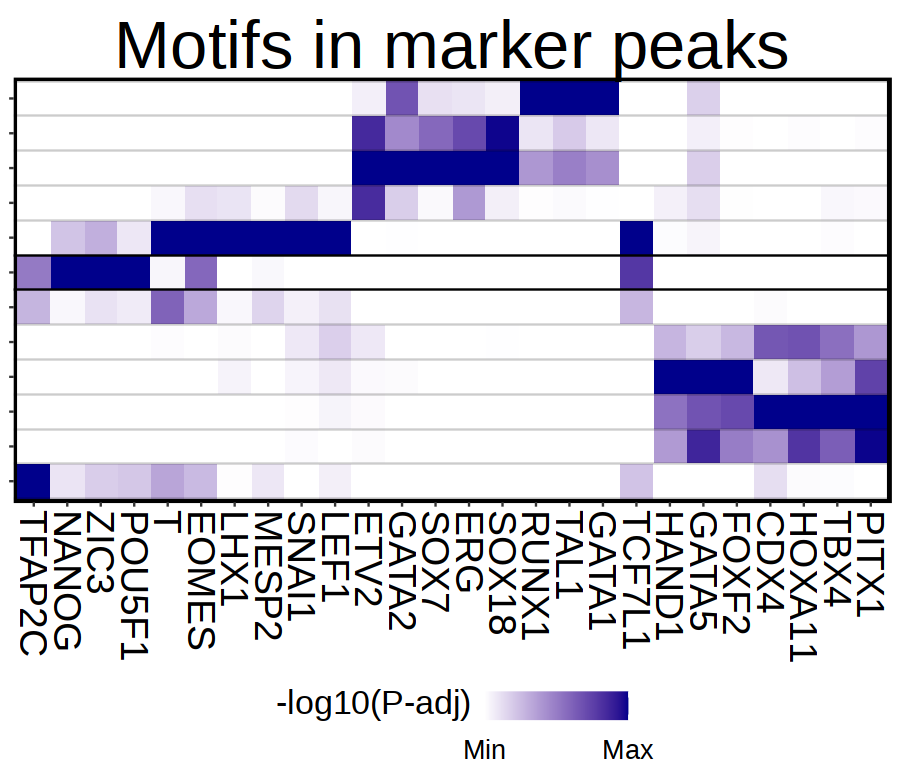

In [205]:
TFs_plot = c('TFAP2C', # Add TFAP2C once updated chromvar is done!
             'NANOG', 'ZIC3','POU5F1',
             'T', 'EOMES', 
             'LHX1', 'MESP2',  'SNAI1', 'MESP2', 'LEF1', 
             'ETV2', 'GATA2', 
             'SOX7', 'ERG', 'SOX18', 
             'RUNX1', 'TAL1', 'GATA1', 
             'TCF7L1', 
             'HAND1', 'GATA5', 'FOXF2',
             'CDX4', 'HOXA11', 'TBX4',  'PITX1'
             )

options(repr.plot.width=7.5, repr.plot.height=6.5)
plot_enr_heatmap(enrichMotifs, TFs = TFs_plot, ntop=10000)


In [327]:
plot_enr_heatmap = function(enrichMotifs, ntop=25, TFs = NULL) {
    heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = ntop, returnMatrix = TRUE)
    rownames(heatmapEM) = str_split(rownames(heatmapEM), ' ') %>% map_chr(1)
    
    enriched.dt = melt(as.data.table(heatmapEM, keep.rownames=T) %>% setnames('rn', 'TF'), id.vars = c("TF")) %>%
        .[order(-value)] %>% .[,TF:=strsplit(TF, '_') %>% map_chr(1)]

    if(!is.null(TFs)){
        keep_tfs = TFs
    }else{
        keep_tfs = enriched.dt %>% .[,variable:=factor(variable, levels= names(opts$celltype_v2.colors))] %>% .[order(variable)] %>% .[, head(.SD, ntop),  by=variable] %>% .$TF   
    }
    
    enriched.dt = enriched.dt[TF %in% keep_tfs] %>% .[order( -value)] %>% 
        #.[,TF:=strsplit(TF, '_') %>% map_chr(1)] %>%
         .[,TF:=factor(TF, levels=unique(keep_tfs))] %>%
        .[,variable:=factor(variable, levels=names(opts$celltype_v2.colors))]

    p = ggplot(enriched.dt, aes(TF, variable, fill=value)) + 
        geom_tile() +
        scale_fill_gradient(low='white', high='darkblue', name='-log10(P-adj)', breaks = c(0,100), labels = c('Min', 'Max')) +
        guides(fill = guide_colourbar(
            barwidth = 2.5, barheight = 0.5,
            frame.colour = "black", 
            ticks.colour = "black"
        )) + 
        scale_y_discrete(limits = names(opts$celltype_v2.colors)) +
        scale_x_discrete(limits = unique(keep_tfs), expand = c(0,0,0,0)) +
        geom_hline(yintercept=seq(.5, 20, 1), alpha=0.2, linewidth = 0.1) + 
        geom_hline(yintercept=c(6.5, 7.5), alpha=1, linewidth = 0.1) + 
        ggtitle('Motifs in marker peaks') + 
        theme(text=element_text(size=6), 
                         axis.text.x=element_text(angle=90,hjust=1,vjust=0.5, size=6, color = 'black'), 
                         axis.text.y=element_blank(),
                         axis.title = element_blank(),
                         panel.border = element_rect(color='black', linewidth=0.5, fill = NA),
                         panel.background = element_blank(),
                         plot.title = element_text(size=8, hjust=0.5, vjust=-1.5, face='plain'),
                         axis.line = element_blank(),
                         axis.ticks=element_line(linewidth=0.25),
                         legend.title = element_text(size = 7, hjust=0, vjust = 1),
                         legend.text = element_text(size = 6, hjust=0.5, vjust = 1),
                         legend.position = 'bottom')
    return(p)
}

In [328]:
p3 = plot_enr_heatmap(enrichMotifs, TFs = TFs_plot, ntop=10000)


ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-369f1193c9129-Date-2024-06-19_Time-17-51-21.log
If there is an issue, please report to github with logFile!



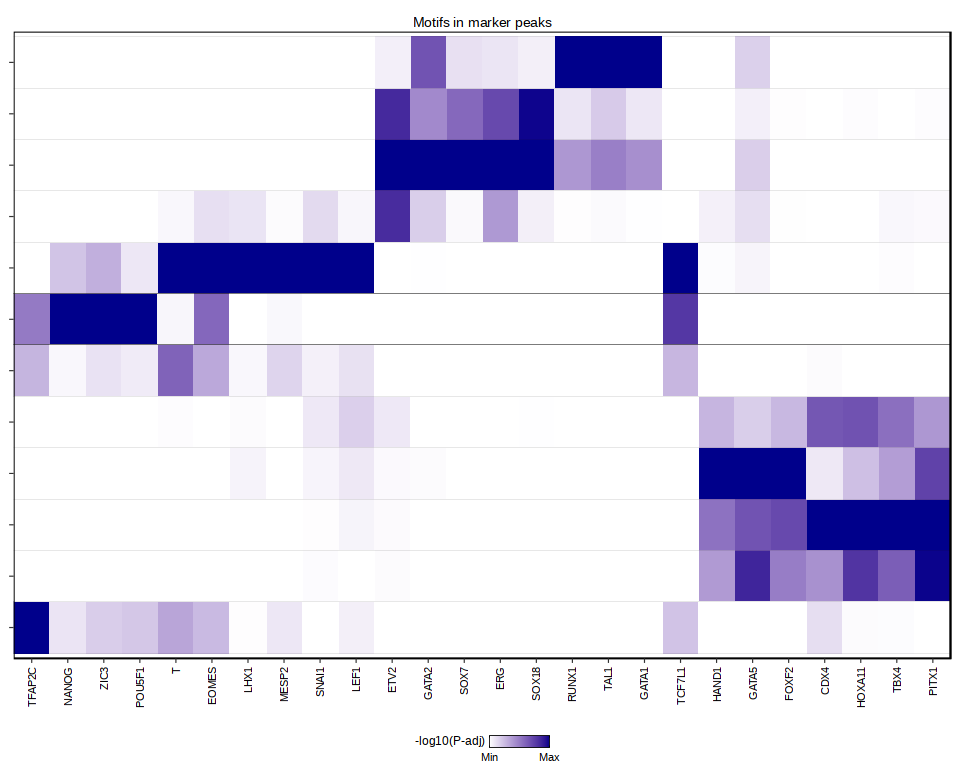

In [329]:
p3

In [314]:
ggsave(file.path(io$basedir, 'figures/WT_celltype_motif_enrichment.pdf'), 
       plot = p3 + theme(legend.position = 'none'),
       width = 80, 
       height = 40, 
       units = "mm")

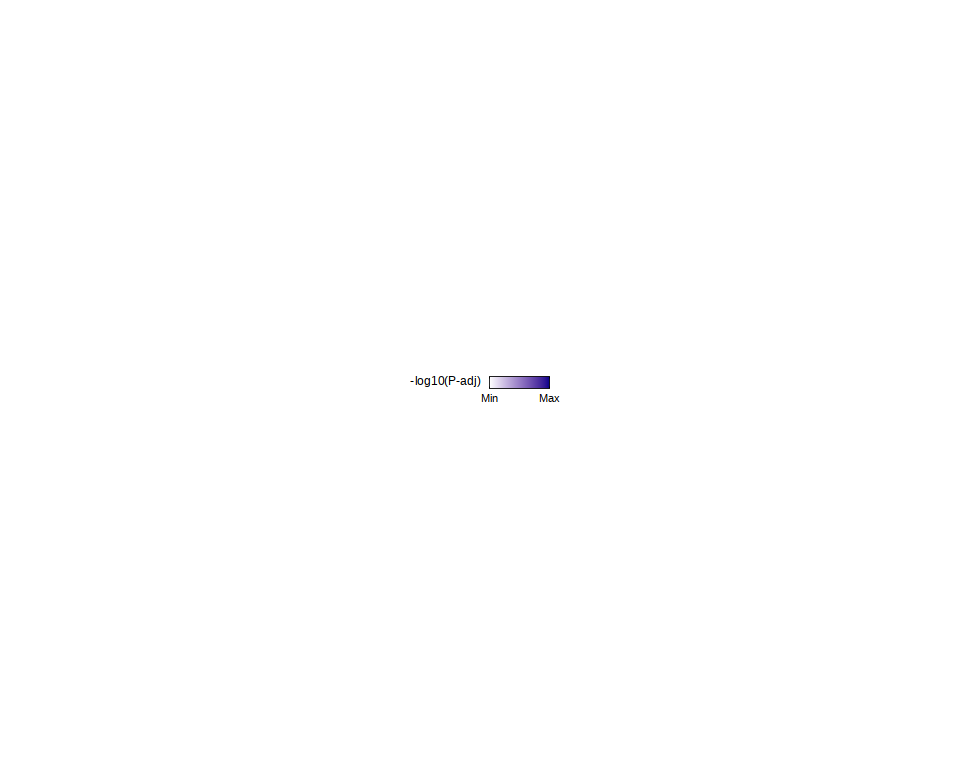

In [315]:
celltype_legend = as_ggplot(get_legend(p3 + theme(legend.key.size  = unit(0, "pt"),
                                                 legend.margin=margin(0,0,0,0),
                                                 legend.key = element_blank())))

celltype_legend
ggsave(file.path(io$basedir, 'figures/WT_celltype_motif_enrichment_legend.pdf'), 
       plot = celltype_legend,
       width = 45, 
       height = 8, 
       units = "mm")

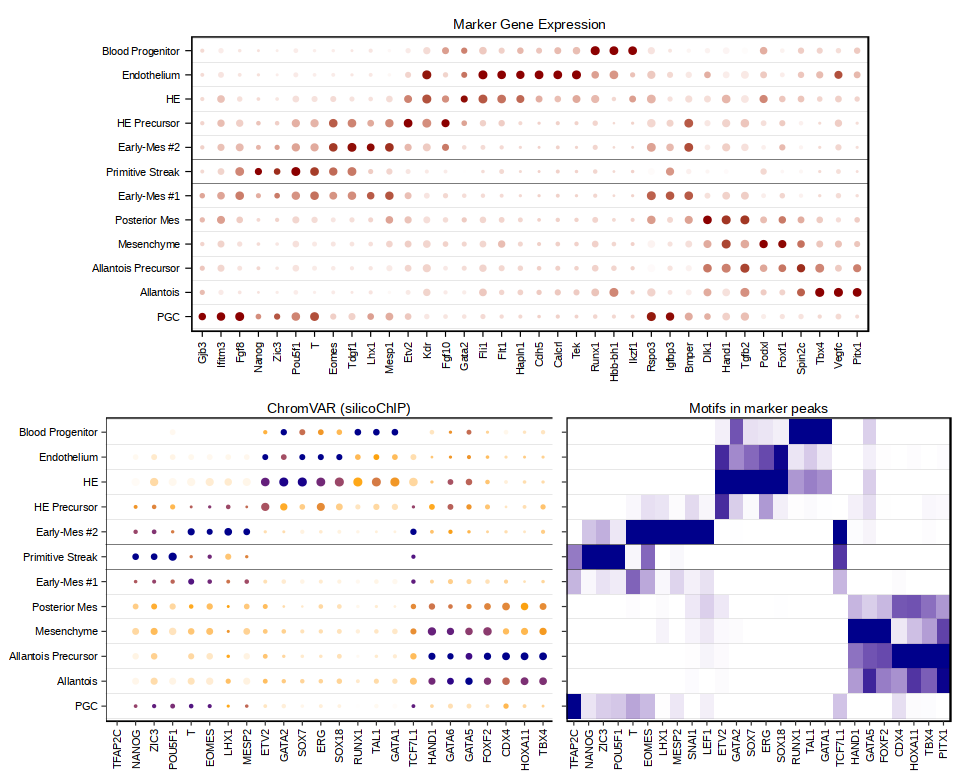

In [316]:
p = ggarrange(ggarrange(NULL,
                        p1 + theme(legend.position = 'none'),
                        NULL, 
                        nrow = 1, widths = c(0.1, 1, 0.1)), 
              NULL,
              ggarrange(p2 + theme(legend.position = 'none'), 
                        NULL,
                        p3 + theme(legend.position = 'none'), 
                        nrow = 1, widths = c(1,-0.025,0.7)), 
          ncol = 1, heights = c(1,-0.02, 1))
p

In [319]:
ggsave(file.path(io$basedir, 'figures/WT_celltype_profiling.pdf'), 
       plot = p,
       width = 120, 
       height = 90, 
       units = "mm")

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-118a913eea01-Date-2024-04-29_Time-10-15-57.log
If there is an issue, please report to github with logFile!



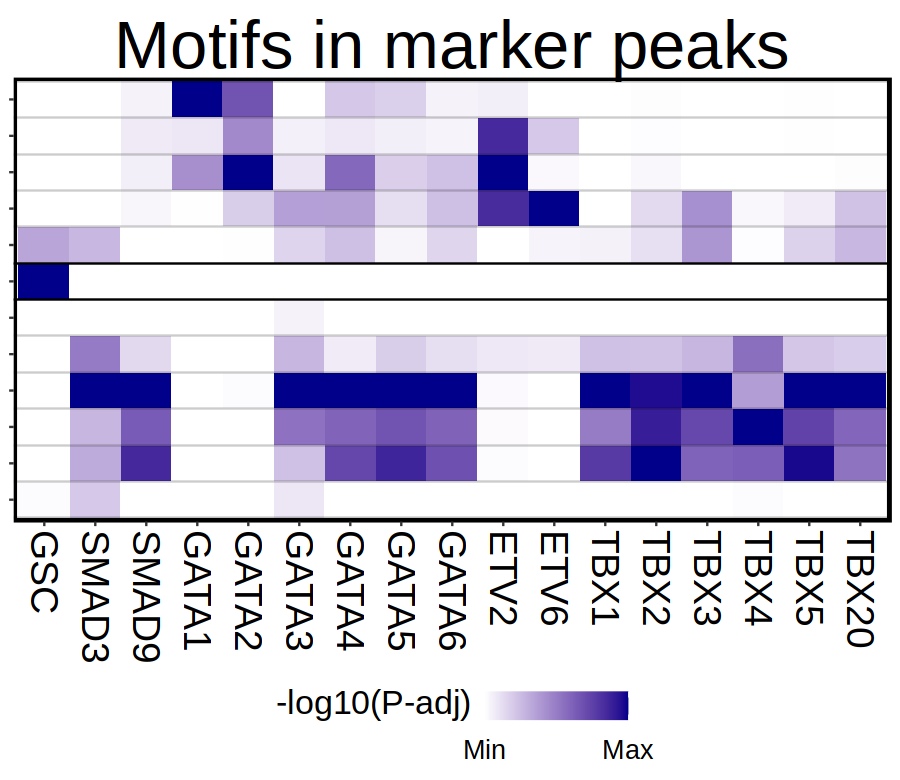

In [39]:
TFs_plot = c('GSC', paste0('SMAD', 1:9), paste0('GATA', 1:10), paste0('ETV', 1:10), paste0('TBX', 1:20))
TFs_plot = intersect(TFs_plot, rownames(enrichMotifs))

options(repr.plot.width=7.5, repr.plot.height=6.5)
plot_enr_heatmap(enrichMotifs, TFs = TFs_plot, ntop=10000)


# MOTIF ENRICHMENT TESTING DIFFERENT PARAMATERS FOR DAR TESTING

### Motif Enrichment

In [5]:
args$archr_directory = file.path(io$basedir, 'processed/atac/archR')
ArchRProject <- loadArchRProject(args$archr_directory)[meta$cell]
ArchRProject = ArchRProject[meta$cell]

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

In [6]:
addArchRThreads(22)

Setting default number of Parallel threads to 22.



In [7]:
ArchRProject <- addCellColData(ArchRProj = ArchRProject, 
                                    data = meta$celltype_v1,
                                    cells = meta$cell,
                                    name = "celltype_v1",
                                    force=TRUE)
ArchRProject <- addCellColData(ArchRProj = ArchRProject, 
                                    data = meta$celltype_v2,
                                    cells = meta$cell,
                                    name = "celltype_v2",
                                    force=TRUE)

In [19]:
plot_enr_heatmap = function(enrichMotifs, ntop=25, TFs = NULL) {
    heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = ntop, returnMatrix = TRUE)
    rownames(heatmapEM) = str_split(rownames(heatmapEM), ' ') %>% map_chr(1)
    
    enriched.dt = melt(as.data.table(heatmapEM, keep.rownames=T) %>% setnames('rn', 'TF'), id.vars = c("TF")) %>%
        .[order(-value)] %>% .[,TF:=strsplit(TF, '_') %>% map_chr(1)]

    if(!is.null(TFs)){
        keep_tfs = TFs
    }else{
        keep_tfs = enriched.dt %>% .[,variable:=factor(variable, levels= names(opts$celltype_v2.colors))] %>% .[order(c(variable))] %>% .[, head(.SD, ntop),  by=variable] %>% .$TF   
    }
    
    enriched.dt = enriched.dt[TF %in% keep_tfs] %>% .[order( -value)] %>% 
        #.[,TF:=strsplit(TF, '_') %>% map_chr(1)] %>%
         .[,TF:=factor(TF, levels=unique(keep_tfs))] %>%
        .[,variable:=factor(variable, levels=names(opts$celltype_v2.colors))]

    p = ggplot(enriched.dt, aes(TF, variable, fill=value)) + 
        geom_tile() +
        scale_fill_gradient(low='white', high='darkblue', name='-log10(P-adj)', breaks = c(0,100), labels = c('Min', 'Max')) +
        geom_hline(yintercept=seq(.5, 20, 1), alpha=0.2) + 
        geom_hline(yintercept=c(6.5, 7.5), alpha=1) + 
        ggtitle('Motifs in marker peaks') + 
        theme(text=element_text(size=20), 
             axis.text = element_text(color='black'),
             axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=23), 
             axis.text.y=element_blank(), #text(hjust=1, size = 20),
             axis.title = element_blank(),
             panel.border = element_rect(color='black', linewidth=1.5, fill = NA),
             panel.background = element_blank(),
             plot.title = element_text(size=40, hjust=0.5, vjust=0, face='plain'),
             axis.line = element_blank(),
             legend.title = element_text(hjust=0, vjust = 1),
             legend.text = element_text(hjust=0.5, vjust = 0.5),
             legend.position = 'bottom')
    
p
    return(p)
}

In [9]:
markersPeaks <- getMarkerFeatures(
    ArchRProj = ArchRProject, 
    useMatrix = "PeakMatrix", 
    groupBy = "celltype_v2",
    bias = c("TSSEnrichment", "log10(nFrags)"),
            testMethod = "binomial",
            binarize = TRUE)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-18818556e10efb-Date-2024-05-15_Time-10-48-26.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2024-05-15 10:48:28 : Matching Known Biases, 0.022 mins elapsed.

###########
2024-05-15 10:49:18 : Completed Pairwise Tests, 0.867 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-18818556e10efb-Date-2024-05-15_Time-10-48-26.log



In [10]:
# CISBP
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_cisbp",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  ))

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-18818515d1b3bf-Date-2024-05-15_Time-10-50-09.log
If there is an issue, please report to github with logFile!



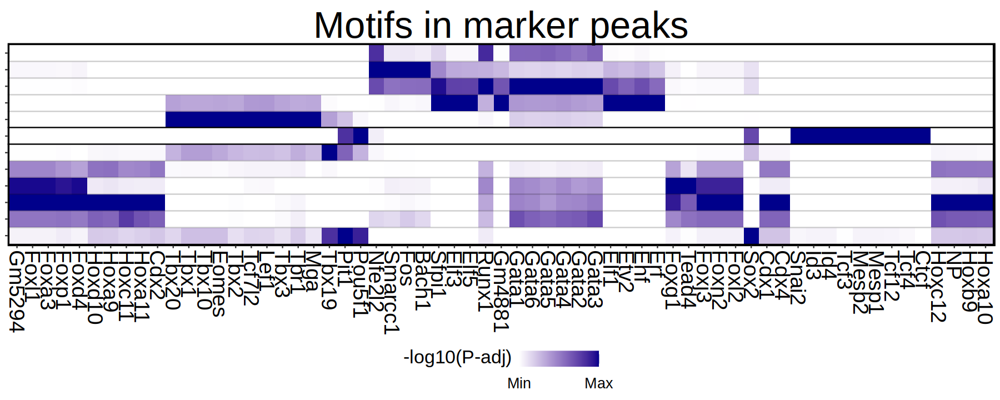

In [13]:
options(repr.plot.width=15, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 10)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-cd7229555ee0-Date-2024-05-14_Time-15-45-16.log
If there is an issue, please report to github with logFile!



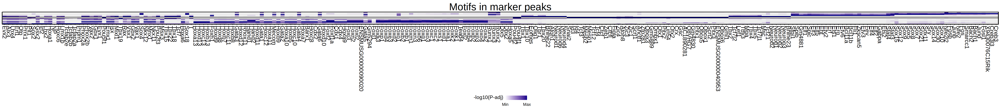

In [12]:
options(repr.plot.width=55, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 50)

In [13]:
rownames(enrichMotifs) = str_split(rownames(enrichMotifs), '_') %>% map_chr(1)

In [14]:
enrichMotifs = enrichMotifs[!duplicated(rownames(enrichMotifs)),]

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-cd721c3b3057-Date-2024-05-14_Time-15-45-17.log
If there is an issue, please report to github with logFile!



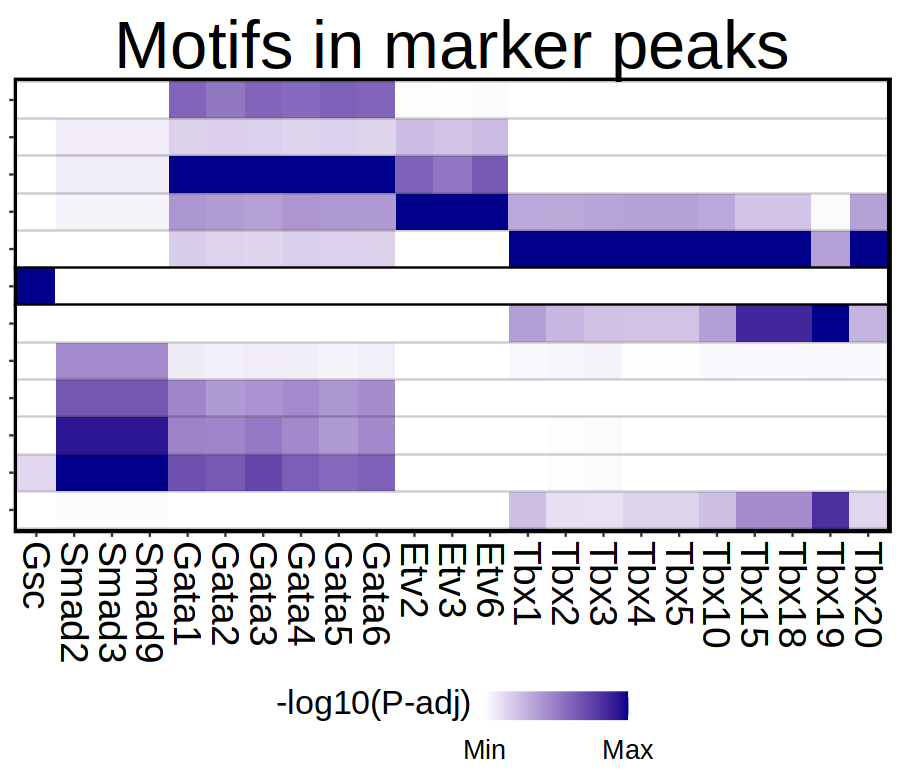

In [15]:
TFs_plot = c('Gsc', paste0('Smad', 1:9), paste0('Gata', 1:10), paste0('Etv', 1:10), paste0('Tbx', 1:20))
TFs_plot = intersect(TFs_plot, rownames(enrichMotifs))

options(repr.plot.width=7.5, repr.plot.height=6.5)
plot_enr_heatmap(enrichMotifs, TFs = TFs_plot, ntop=10000)


ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-cd727f9b4512-Date-2024-05-14_Time-15-45-28.log
If there is an issue, please report to github with logFile!

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-cd7233eae26e-Date-2024-05-14_Time-15-45-29.log
If there is an issue, please report to github with logFile!



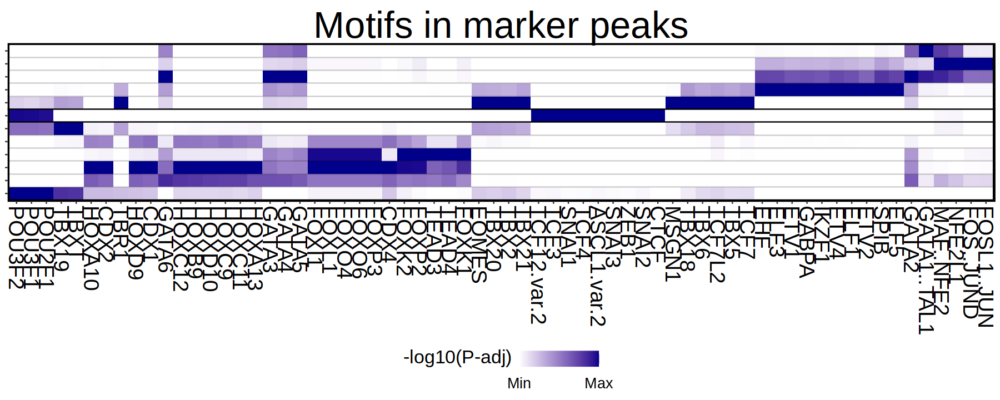

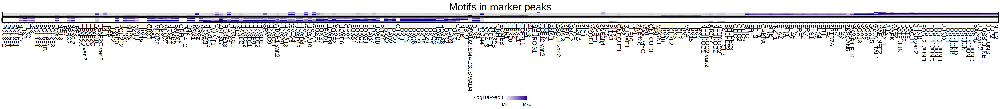

In [16]:
# JASPAR
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_JASPAR2020",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  ))

options(repr.plot.width=15, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 10)

options(repr.plot.width=55, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 50)

In [17]:
rownames(enrichMotifs) = str_split(rownames(enrichMotifs), '_') %>% map_chr(1)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-cd7218c1b8f-Date-2024-05-14_Time-15-45-29.log
If there is an issue, please report to github with logFile!



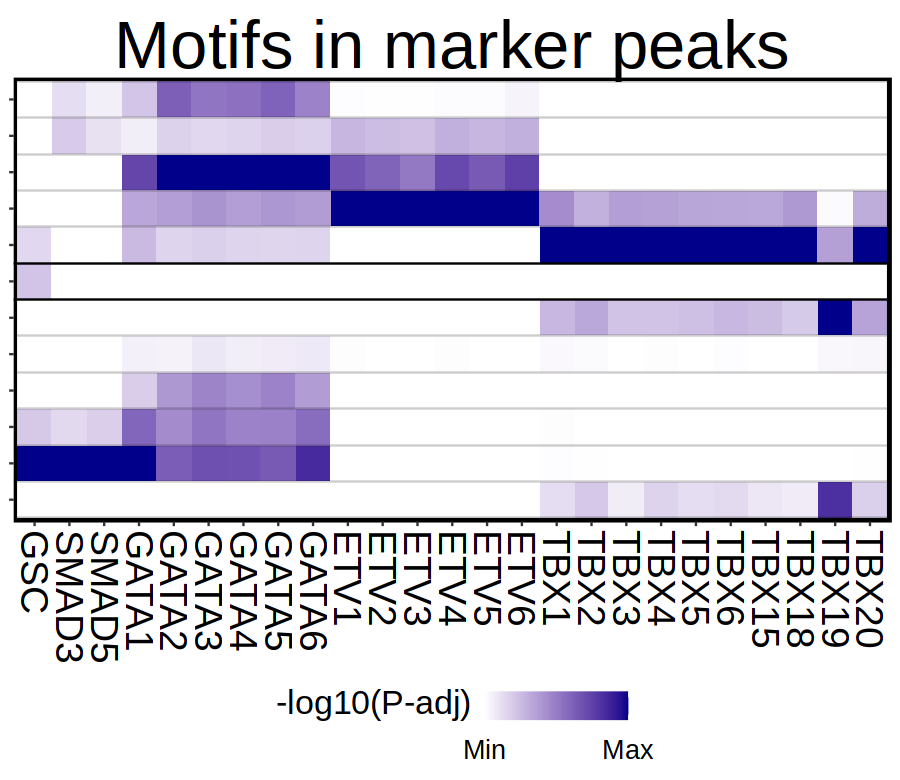

In [18]:
TFs_plot = c('GSC', paste0('SMAD', 1:9), paste0('GATA', 1:10), paste0('ETV', 1:10), paste0('TBX', 1:20))
TFs_plot = intersect(TFs_plot, rownames(enrichMotifs))

options(repr.plot.width=7.5, repr.plot.height=6.5)
plot_enr_heatmap(enrichMotifs, TFs = TFs_plot, ntop=10000)


### silico ChIP motif enrichment

In [19]:
io$multiome = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/multiome_atlas/'
jaspar_silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_jaspar2020.rds'))
assay(jaspar_silico_chip, 'matches') = assay(jaspar_silico_chip, 'VirtualChipScores') > 0.20
assay(jaspar_silico_chip, 'motifScores') = NULL
assay(jaspar_silico_chip, 'motifMatches') = NULL
assay(jaspar_silico_chip, 'motifCounts') = NULL
assay(jaspar_silico_chip, 'VirtualChipScores') = NULL
# Keep only motifs with more than 40 peaks 
tmp = colSums(assay(jaspar_silico_chip, 'matches') )
keep = names(tmp[tmp > 40])
jaspar_silico_chip = jaspar_silico_chip[,keep]

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-cd7211cc3a66-Date-2024-05-14_Time-15-45-41.log
If there is an issue, please report to github with logFile!

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-cd72611ea756-Date-2024-05-14_Time-15-45-42.log
If there is an issue, please report to github with logFile!



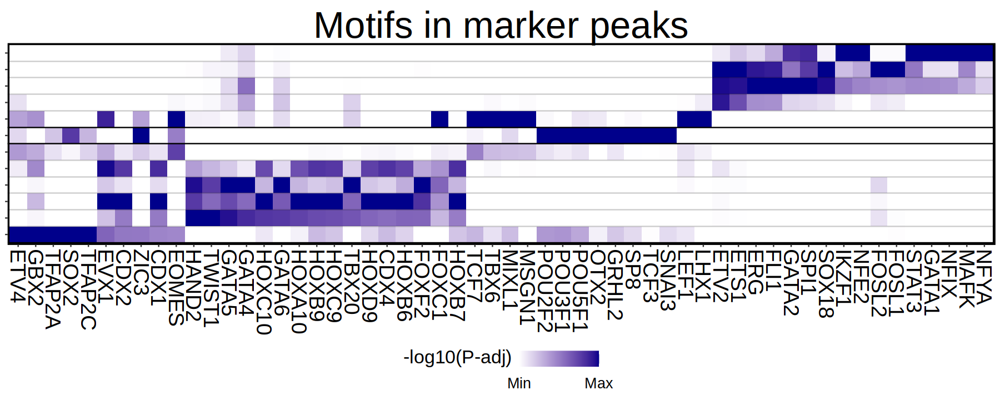

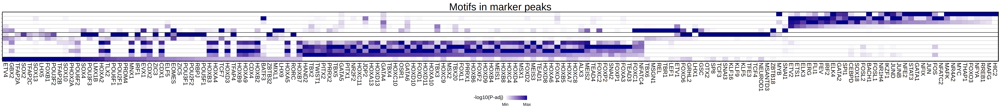

In [20]:
# silicoChip v2 JASPAR
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = ArchRProject,
    #peakAnnotation = "silicoChIP_CISBP",
    matches = jaspar_silico_chip,
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  ))

options(repr.plot.width=15, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 10)

options(repr.plot.width=55, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 50)

In [14]:
io$multiome = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/multiome_atlas/'
cisbp_silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_cisbp.rds'))
assay(cisbp_silico_chip, 'matches') = assay(cisbp_silico_chip, 'VirtualChipScores') > 0.20
assay(cisbp_silico_chip, 'motifScores') = NULL
assay(cisbp_silico_chip, 'motifMatches') = NULL
assay(cisbp_silico_chip, 'motifCounts') = NULL
assay(cisbp_silico_chip, 'VirtualChipScores') = NULL
# Keep only motifs with more than 40 peaks 
tmp = colSums(assay(cisbp_silico_chip, 'matches') )
keep = names(tmp[tmp > 40])
cisbp_silico_chip = cisbp_silico_chip[,keep]

In [15]:
cisbp_silico_chip[,'T']

class: RangedSummarizedExperiment 
dim: 234908 1 
metadata(0):
assays(1): matches
rownames(234908): chr1:3003470-3004070 chr1:3035598-3036198 ...
  chrX:169925416-169926016 chrX:169937236-169937836
rowData names(13): score replicateScoreQuantile ... idx N
colnames(1): T
colData names(1): name

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-18818569bb323b-Date-2024-05-15_Time-10-53-11.log
If there is an issue, please report to github with logFile!



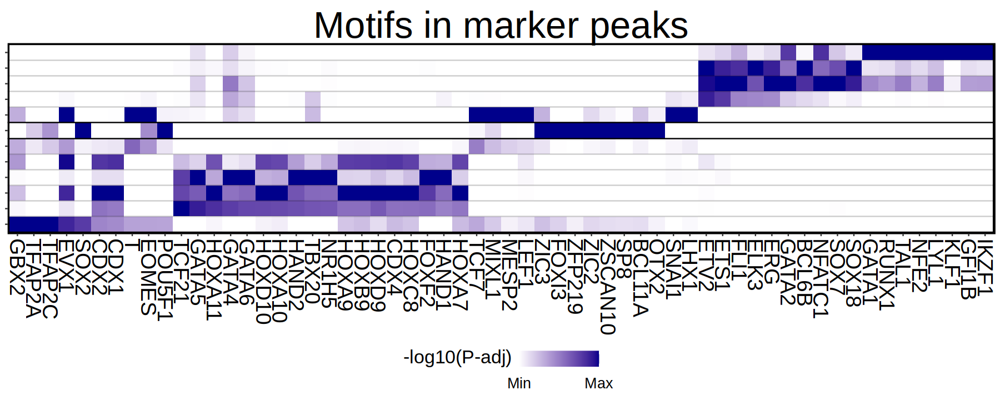

In [20]:
# silicoChip v2 JASPAR
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = ArchRProject,
    #peakAnnotation = "silicoChIP_CISBP",
    matches = cisbp_silico_chip,
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  ))

options(repr.plot.width=15, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 10)

# options(repr.plot.width=55, repr.plot.height=6)
# plot_enr_heatmap(enrichMotifs, ntop = 50)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-cd727719c44d-Date-2024-05-14_Time-15-45-57.log
If there is an issue, please report to github with logFile!



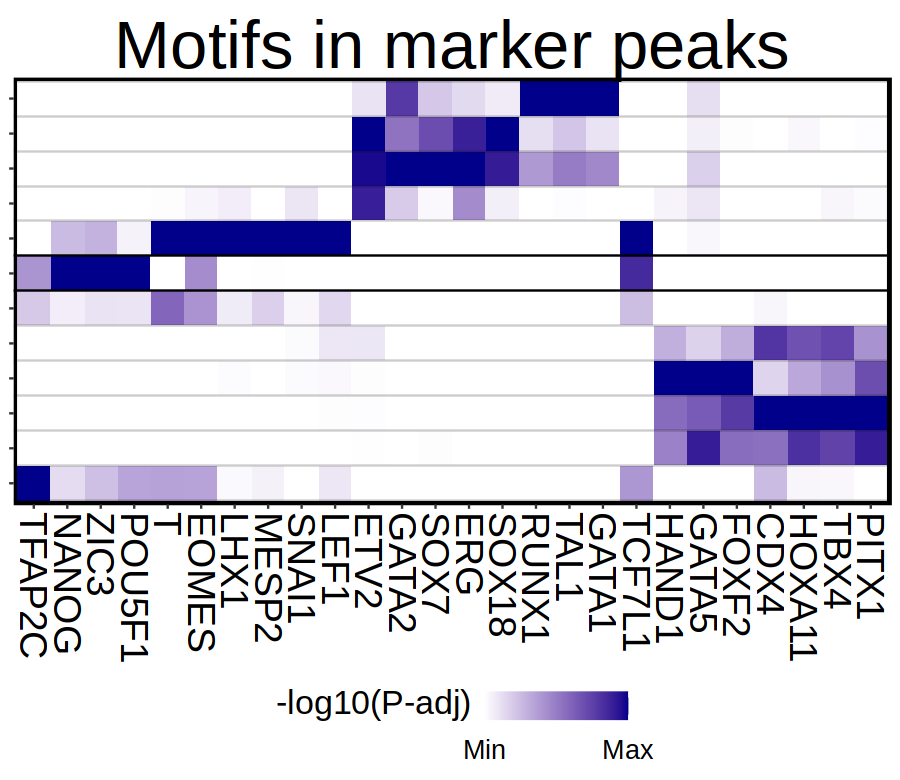

In [24]:
TFs_plot = c('TFAP2C', # Add TFAP2C once updated chromvar is done!
             'NANOG', 'ZIC3','POU5F1',
             'T', 'EOMES', 
             'LHX1', 'MESP2',  'SNAI1', 'MESP2', 'LEF1', 
             'ETV2', 'GATA2', 
             'SOX7', 'ERG', 'SOX18', 
             'RUNX1', 'TAL1', 'GATA1', 
             'TCF7L1', 
             'HAND1', 'GATA5', 'FOXF2',
             'CDX4', 'HOXA11', 'TBX4',  'PITX1'
             )

options(repr.plot.width=7.5, repr.plot.height=6.5)
plot_enr_heatmap(enrichMotifs, TFs = TFs_plot, ntop=10000)


ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-cd726ac8e4e-Date-2024-05-14_Time-15-45-57.log
If there is an issue, please report to github with logFile!



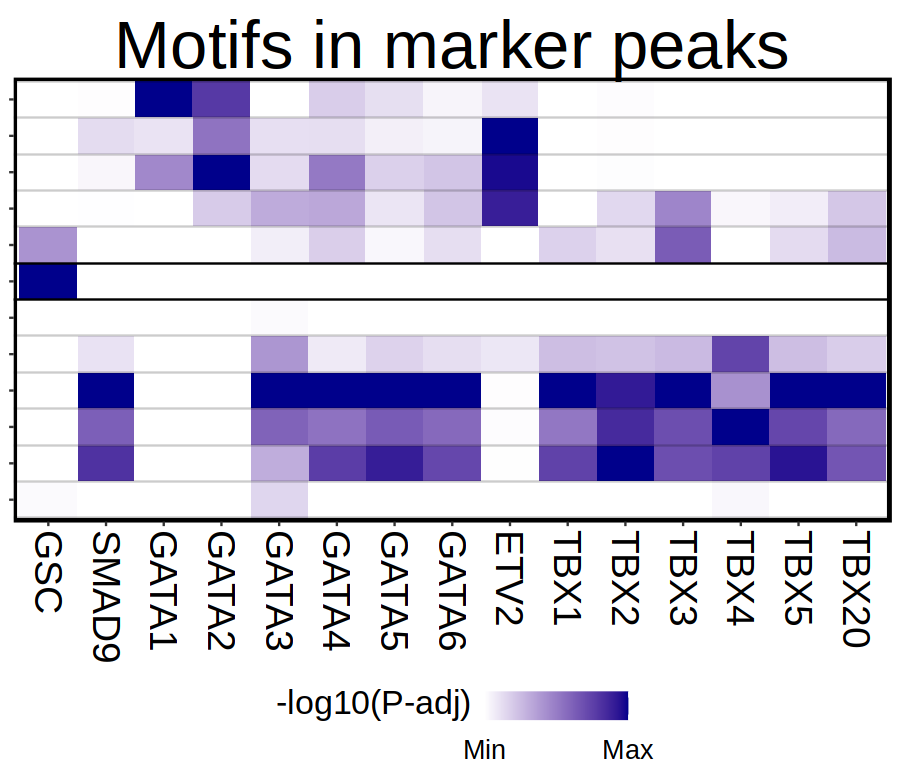

In [25]:
TFs_plot = c('GSC', paste0('SMAD', 1:9), paste0('GATA', 1:10), paste0('ETV', 1:10), paste0('TBX', 1:20))
TFs_plot = intersect(TFs_plot, rownames(enrichMotifs))

options(repr.plot.width=7.5, repr.plot.height=6.5)
plot_enr_heatmap(enrichMotifs, TFs = TFs_plot, ntop=10000)


ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-cd723c7874f9-Date-2024-05-14_Time-15-46-07.log
If there is an issue, please report to github with logFile!

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-cd723c024a3b-Date-2024-05-14_Time-15-46-17.log
If there is an issue, please report to github with logFile!



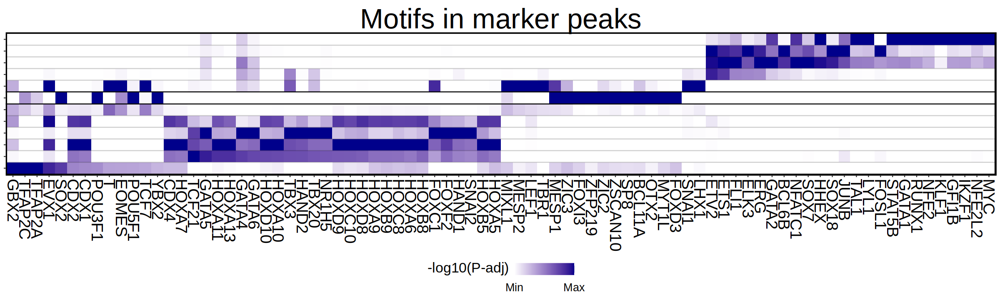

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-cd7273424c42-Date-2024-05-14_Time-15-46-26.log
If there is an issue, please report to github with logFile!



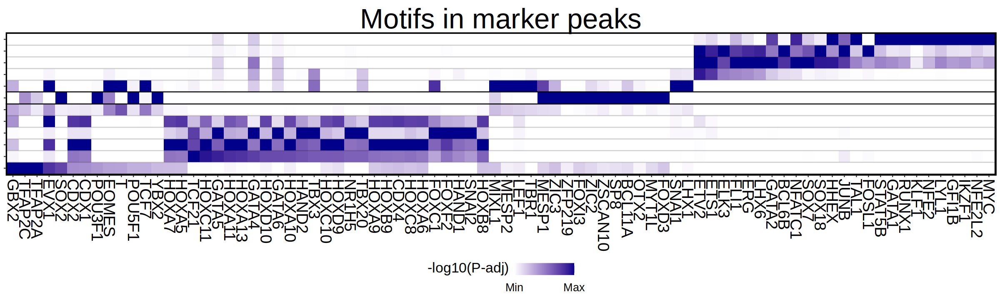

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-cd726c2ae92-Date-2024-05-14_Time-15-46-35.log
If there is an issue, please report to github with logFile!



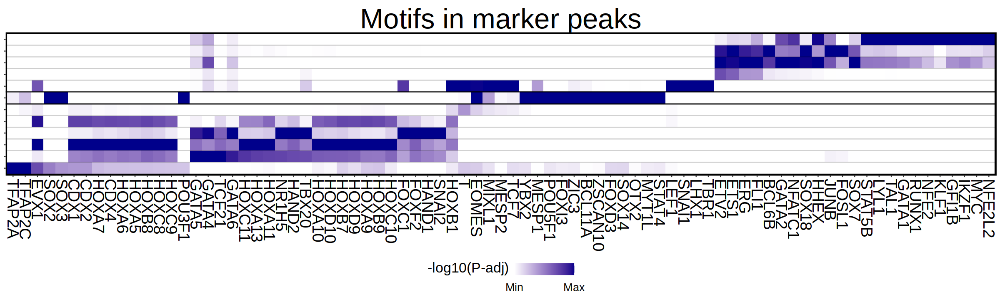

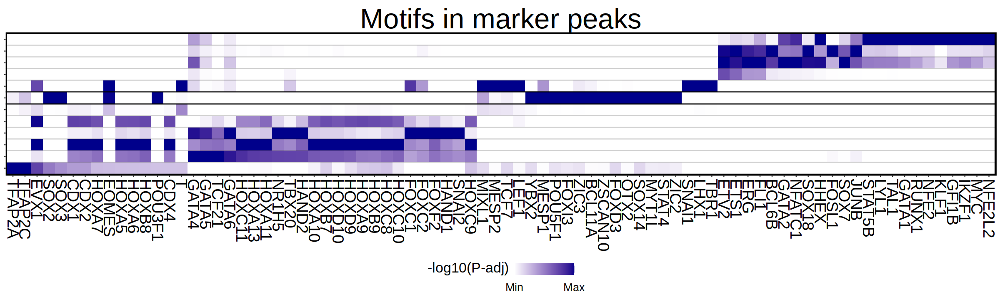

In [26]:
# silicoChip v2 JASPAR
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = ArchRProject,
    #peakAnnotation = "silicoChIP_CISBP",
    matches = cisbp_silico_chip,
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  ))

options(repr.plot.width=20, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 15)

# silicoChip v2 JASPAR
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = ArchRProject,
    #peakAnnotation = "silicoChIP_CISBP",
    matches = cisbp_silico_chip,
    cutOff = "FDR <= 0.05 & Log2FC >= 0.5"
  ))

options(repr.plot.width=20, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 15)

# silicoChip v2 JASPAR
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = ArchRProject,
    #peakAnnotation = "silicoChIP_CISBP",
    matches = cisbp_silico_chip,
    cutOff = "FDR <= 0.1 & Log2FC >= 1"
  ))

options(repr.plot.width=20, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 15)

# silicoChip v2 JASPAR
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = ArchRProject,
    #peakAnnotation = "silicoChIP_CISBP",
    matches = cisbp_silico_chip,
    cutOff = "FDR <= 0.05 & Log2FC >= 1"
  ))

options(repr.plot.width=20, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 15)